# Dubins3D — CBF / Hand-CBF / Duality CBF

Experiments with CBF safety filters on the Dubins 3D car (state: x, y, θ; control: yaw rate ω).
Obstacle at the origin; nominal policy steers toward a goal at (2, 0).

In [2]:
import functools as ft
import sys
sys.path.insert(0, '../../src')
sys.path.insert(0, '../../src/guardian/src')

import jax
import jax.numpy as jnp
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
%matplotlib inline

import flax.linen as nn
import optax

from mrncbf.dyn.dubins3d_avoid import Dubins3DAvoid
from mrncbf.qp.min_norm_cbf import min_norm_cbf, gcbf_qp, rcbf_qp_linear, compute_rcbf_gammas
from mrncbf.utils.jax_utils import jax2np

jax.config.update("jax_enable_x64", False)

task = Dubins3DAvoid()

# ── Simulation constants ──────────────────────────────────────────────────────
DT = 0.05   # finer than class DT=0.1 (Euler steps; 10% of obstacle radius per step)
T  = 50    # steps → 10 s

# ── QP / CBF constants ────────────────────────────────────────────────────────
ALPHA_QP = 1.0          # CBF decay rate α
V_SHIFT  = 0.0          # optional barrier shift
u_lb     = jnp.array([-1.0])
u_ub     = jnp.array([ 1.0])
BASE_KEY = jax.random.PRNGKey(42)

# ── HOCBF alpha — shared by rollouts and the MC filter cell ──────────────────
hocbf_alpha = 1.0   # change here; re-run this cell + later cells to propagate

# ── Noise for duality CBF demo ────────────────────────────────────────────────
# STATE_EPS_DUAL = jnp.array([0.1, 0.7, 0.005])   # x, y, theta (m, m, rad)
STATE_EPS_DUAL = jnp.array([0.1, 0.1, 0.001])
# STATE_EPS_DUAL = jnp.array([0.1, 0.1, 0.001])
# STATE_EPS_DUAL = jnp.array([0.1, 0.3, 0.001])
# STATE_EPS_DUAL = jnp.array([0.1, 0.4, 0.001])

# ── Training range for phi network (eps sampled from Uniform[0, EPS_MAX]) ─────
EPS_MAX = jnp.array([0.3, 0.5, 0.01])   # per-dimension max uncertainty radii

# ── NMR-CBF weights path (set to None to retrain from scratch) ───────────────
NMR_WEIGHTS_DIR = '../../runs/nmr_cbf_dubins3d'

print(f"Task: nx={task.NX}, nu={task.NU}, umax={task.umax:.3f} rad/s")
print(f"Obstacle: center={tuple(float(v) for v in task.pos_obs)}, r={task.radius_obs}")
print(f"DT={DT}s, T={T} steps ({T*DT:.1f}s total)")

plt.rcParams['figure.dpi'] = 200
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.size'] = 16
mpl.rcParams['text.usetex'] = True


Jax plugin configuration error: Exception when calling jax_plugins.xla_cuda12.initialize()
Traceback (most recent call last):
  File "/home/nrober/.pyenv/versions/pncbf_gpu/lib/python3.10/site-packages/jax_plugins/xla_cuda12/__init__.py", line 197, in _version_check
    version = get_version()
RuntimeError: cuDNN not found.

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/home/nrober/.pyenv/versions/pncbf_gpu/lib/python3.10/site-packages/jax/_src/xla_bridge.py", line 614, in discover_pjrt_plugins
    plugin_module.initialize()
  File "/home/nrober/.pyenv/versions/pncbf_gpu/lib/python3.10/site-packages/jax_plugins/xla_cuda12/__init__.py", line 324, in initialize
    _check_cuda_versions(raise_on_first_error=True)
  File "/home/nrober/.pyenv/versions/pncbf_gpu/lib/python3.10/site-packages/jax_plugins/xla_cuda12/__init__.py", line 233, in _check_cuda_versions
    cudnn_version = _version_check(
  File "/home/nrober/.pyenv/v

Task: nx=3, nu=1, umax=0.785 rad/s
Obstacle: center=(0.0, 0.0), r=0.5
DT=0.05s, T=50 steps (2.5s total)


## Task verification

Check that the dynamics and safety constraint look correct.

Equilibrium state  x0 = [0. 0. 0.]
Drift  f(x0)          = [1. 0. 0.]  (vel=1.0 m/s eastward at θ=0)
Input  G(x0)          = [0.         0.         0.78539816]
h_components(x0)      = [0.4934082]  (obstacle dist-r = -0.493 m)
handcbf_B(x0, α=1.0) = [nan]


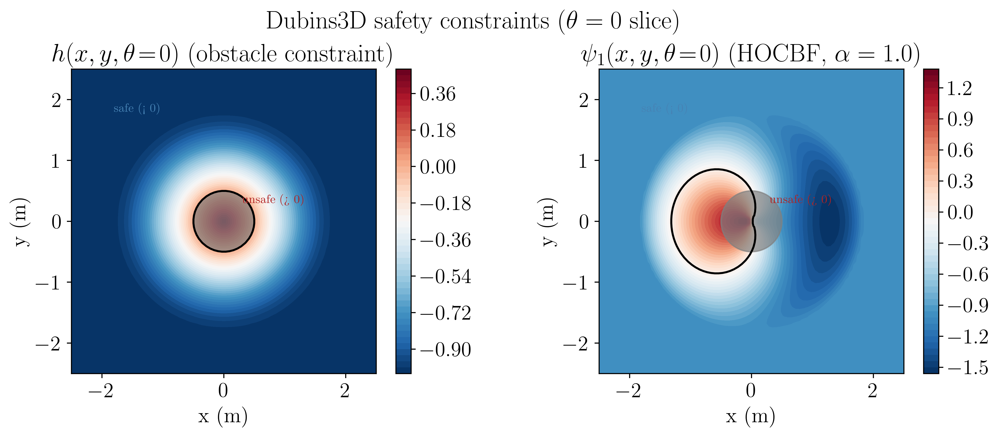

In [354]:
x0 = jnp.array(task.eq_state())   # (0, 0, 0)
f0 = task.f(x0)
G0 = task.G(x0)
h0 = task.h_components(x0)
B0 = task.handcbf_B(x0, hocbf_alpha)

print(f"Equilibrium state  x0 = {jax2np(x0)}")
print(f"Drift  f(x0)          = {jax2np(f0)}  (vel={task.VEL} m/s eastward at θ=0)")
print(f"Input  G(x0)          = {jax2np(G0).flatten()}")
print(f"h_components(x0)      = {jax2np(h0)}  (obstacle dist-r = {-float(h0[0]):.3f} m)")
print(f"handcbf_B(x0, α={hocbf_alpha}) = {jax2np(B0)}")

# ── Visualise h and ψ₁ over the xy plane (θ=0) ───────────────────────────────
n = 80
xs_g = np.linspace(-2.5, 2.5, n)
ys_g = np.linspace(-2.5, 2.5, n)
XX, YY = np.meshgrid(xs_g, ys_g)
x_grid = jnp.array(np.stack([XX.ravel(), YY.ravel(), np.zeros(n*n)], axis=1))

nh = task.nh
# vmap returns (n*n, nh); reshape to (n, n, nh) then index [:,:,0]
h_grid = jax2np(jax.vmap(task.h_components)(x_grid)).reshape(n, n, nh)
B_grid = jax2np(jax.vmap(lambda xi: task.handcbf_B(xi, hocbf_alpha))(x_grid)).reshape(n, n, nh)

fig, axes = plt.subplots(1, 2, figsize=(11, 4.5), layout='constrained')
for ax, Z, title in zip(axes,
                         [h_grid[:,:,0], B_grid[:,:,0]],
                         [r'$h(x,y,\theta\!=\!0)$  (obstacle constraint)',
                          rf'$\psi_1(x,y,\theta\!=\!0)$  (HOCBF, $\alpha={hocbf_alpha}$)']):
    cm = ax.contourf(XX, YY, Z, levels=50, cmap='RdBu_r')
    ax.contour(XX, YY, Z, levels=[0.0], colors='k', linewidths=1.5)
    fig.colorbar(cm, ax=ax)
    obs = plt.Circle((float(task.pos_obs[0]), float(task.pos_obs[1])),
                     task.radius_obs, color='gray', alpha=0.7)
    ax.add_patch(obs)
    ax.set(title=title, xlabel='x (m)', ylabel='y (m)', aspect='equal',
           xlim=(-2.5, 2.5), ylim=(-2.5, 2.5))
    ax.annotate('safe (< 0)', xy=(-1.8, 1.8), color='steelblue', fontsize=9)
    ax.annotate('unsafe (> 0)', xy=(0.3, 0.3), color='firebrick', fontsize=9)
plt.suptitle(rf'Dubins3D safety constraints ($\theta=0$ slice)')
plt.show()


## Nominal-policy rollouts

The nominal `nom_pol_goto` steers toward (2, 0) and drives straight through the obstacle when unconstrained.

## Hand-CBF safety filter

Apply the HOCBF `handcbf_B` (ψ₁ = L_f h + α h) via a min-norm QP.  Control appears in ψ̇₁, so the QP is feasible (relative degree 2 → 1 for ψ₁).

In [355]:
# ── A few challenging initial conditions ─────────────────────────────────────
x_ics = {
    # 'head-on':   jnp.array([-1.6,  -0.03,  0.0]),           # east, straight at obstacle
    'head-on':   jnp.array([-1.6,  -0.03,  0.0]),           # east, straight at obstacle
    'from below':jnp.array([-0.5, -1.5,  np.pi/2]),        # north from below
    'diagonal':  jnp.array([-1.2, -1.0,  np.pi/6]),        # NE approach
    'head-on+':  jnp.array([-1.6,  0.03,  0.0]),           # east, straight at obstacle, other side
}

# ── Rollout helper ────────────────────────────────────────────────────────────
def _make_rollout(step_fn):
    """Wrap step_fn(x, step_idx) → (x_next, x) into a JIT-compiled rollout."""
    def rollout(x0):
        _, xs = jax.lax.scan(step_fn, x0, jnp.arange(T))
        return jnp.concatenate([x0[None], xs], axis=0)   # (T+1, nx)
    return jax.jit(rollout)

# ── Nominal step (no noise, no CBF) ──────────────────────────────────────────
def _nom_step(x, step_idx):
    u = task.nom_pol_goto(x)
    return x + DT * task.xdot(x, u), x

rollout_nom = _make_rollout(_nom_step)

# ── Hand-CBF step (perfect state estimate) ────────────────────────────────────
def _handcbf_step(x, step_idx):
    u_nom = task.nom_pol_goto(x)
    h_B   = task.handcbf_B(x, hocbf_alpha) + V_SHIFT
    hx_B  = jax.jacobian(lambda xi: task.handcbf_B(xi, hocbf_alpha))(x)
    u, _, _ = min_norm_cbf(ALPHA_QP, u_lb, u_ub, h_B, hx_B,
                            task.f(x), task.G(x), u_nom, relax_eps2=0.1)
    return x + DT * task.xdot(x, u), x

rollout_handcbf = _make_rollout(_handcbf_step)


## Duality CBF — robust to measurement noise

With noisy state estimates the naive CBF may apply the wrong control.  The duality CBF finds the worst-case state inside the uncertainty box for each (constraint, direction) pair and passes all of them to a single QP.

In [356]:
# ── Constant bias noise model ─────────────────────────────────────────────────
# A single bias is sampled once per trajectory and added to every state estimate.
# More realistic than i.i.d. per-step noise for sensor offsets / GPS drift.
def _sample_bias(key):
    return jax.random.uniform(key, (task.NX,), minval=-STATE_EPS_DUAL, maxval=STATE_EPS_DUAL)

# ── Projected gradient ascent over a box ─────────────────────────────────────
def proj_grad_max_box(scalar_fn, lo, hi, n_restarts, n_steps, lr, key):
    """Maximise scalar_fn over [lo, hi] via projected gradient ascent."""
    x0s = lo[None] + jax.random.uniform(key, (n_restarts, lo.shape[0])) * (hi - lo)
    def run_one(x0):
        def step(x, _):
            g = jax.grad(scalar_fn)(x)
            return jnp.clip(x + lr * g, lo, hi), None
        x_star, _ = jax.lax.scan(step, x0, None, length=n_steps)
        return scalar_fn(x_star), x_star
    vals, xs = jax.vmap(run_one)(x0s)
    best = jnp.argmax(vals)
    return vals[best], xs[best]

# ── CBF ingredients: h, Lf h, LG h ───────────────────────────────────────────
def _cbf_ingredients(x):
    h  = task.handcbf_B(x, hocbf_alpha)
    hx = jax.jacobian(lambda xi: task.handcbf_B(xi, hocbf_alpha))(x)
    return h, hx @ task.f(x), hx @ task.G(x)

# ── Dual directions on S^1 (nu+1 = 2 for Dubins) ─────────────────────────────
N_PLANES_DUAL = 2
angles        = np.linspace(0, 2*np.pi, N_PLANES_DUAL, endpoint=False)
_DUAL_DIRS    = np.stack([np.cos(angles), np.sin(angles)], axis=1).astype(np.float32)

_NH = task.nh   # 1
_nu = task.nu   # 1

# ── Step functions — carry = (x_true, bias) ───────────────────────────────────
# bias is sampled once before the rollout; xhat = x_true + bias every step.

def _nom_noisy_step(carry, step_idx):
    x, bias = carry
    xhat = x + bias
    u    = task.nom_pol_goto(xhat)
    return (x + DT * task.xdot(x, u), bias), (x, xhat)

def _cbf_noisy_step(carry, step_idx):
    """Naive hand-CBF applied at biased estimate — no bias awareness."""
    x, bias = carry
    xhat  = x + bias
    h_B   = task.handcbf_B(xhat, hocbf_alpha) + V_SHIFT
    hx_B  = jax.jacobian(lambda xi: task.handcbf_B(xi, hocbf_alpha))(xhat)
    u_nom = task.nom_pol_goto(xhat)
    u, _, _ = min_norm_cbf(ALPHA_QP, u_lb, u_ub, h_B, hx_B,
                            task.f(xhat), task.G(xhat), u_nom, relax_eps2=0.1)
    return (x + DT * task.xdot(x, u), bias), (x, xhat)

def _duality_step(carry, step_idx):
    """Duality CBF: worst-case over uncertainty box centred on biased estimate."""
    x, bias = carry
    xhat  = x + bias
    lo    = xhat - STATE_EPS_DUAL
    hi    = xhat + STATE_EPS_DUAL
    u_nom = task.nom_pol_goto(xhat)

    # Random restarts for proj-grad — keyed by step so they vary each step
    opt_key  = jax.random.fold_in(BASE_KEY, step_idx)
    all_keys = jax.random.split(opt_key, N_PLANES_DUAL)

    def _worst_one(d_vec, k_j):
        def _obj(xi):
            h, Lf_h, LG_h = _cbf_ingredients(xi)
            return d_vec[0] * LG_h[0, 0] + d_vec[1] * (Lf_h[0] + ALPHA_QP * h[0])
        _, x_star = proj_grad_max_box(_obj, lo, hi, n_restarts=4, n_steps=25, lr=0.05, key=k_j)
        h_s, Lf_s, LG_s = _cbf_ingredients(x_star)
        return h_s[0], Lf_s[0], LG_s[0]

    h_all, Lf_all, LG_all = jax.vmap(_worst_one)(jnp.array(_DUAL_DIRS), all_keys)
    u, _, _ = gcbf_qp(ALPHA_QP, u_lb, u_ub, h_all, Lf_all, LG_all, u_nom, relax_eps2=0.1)
    return (x + DT * task.xdot(x, u), bias), (x, xhat)

# ── Rollout wrapper: rollout(x0, bias) → (xs_full, xhats) ────────────────────
def _make_noisy_rollout(step_fn):
    def rollout(x0, bias):
        _, (xs, xhats) = jax.lax.scan(step_fn, (x0, bias), jnp.arange(T))
        xs_full = jnp.concatenate([x0[None], xs], axis=0)
        return xs_full, xhats
    return jax.jit(rollout)

rollout_nom_noisy = _make_noisy_rollout(_nom_noisy_step)
rollout_cbf_noisy = _make_noisy_rollout(_cbf_noisy_step)
rollout_duality   = _make_noisy_rollout(_duality_step)

print(f"Duality: {_NH} constraint x {N_PLANES_DUAL} directions = {_NH*N_PLANES_DUAL} pairs")
print("Compiling...")
x_test    = jnp.array(list(x_ics.values())[0])
bias_test = _sample_bias(BASE_KEY)
rollout_nom_noisy(x_test, bias_test); print("  nom+noise done")
rollout_cbf_noisy(x_test, bias_test); print("  CBF+noise done")
rollout_duality(x_test, bias_test);   print("  duality done")
# ── R-CBF-QP step function ────────────────────────────────────────────────────
# Samples N random states from the uncertainty box, computes gammas that bound
# the worst-case CBF constraint error, then solves a tightened QP.
N_RCBF_SAMPLES = 20

def _rcbf_step(carry, step_idx):
    """R-CBF-QP: sample-based tightening over the uncertainty box."""
    x, bias = carry
    xhat = x + bias
    lo   = xhat - STATE_EPS_DUAL
    hi   = xhat + STATE_EPS_DUAL

    samp_key = jax.random.fold_in(BASE_KEY, step_idx)
    x_pert   = lo[None] + jax.random.uniform(samp_key, (N_RCBF_SAMPLES, task.NX)) * (hi - lo)

    _h_fn  = lambda xi: task.handcbf_B(xi, hocbf_alpha)
    _hx_fn = jax.jacobian(_h_fn)

    h_V_nom   = _h_fn(xhat)
    hx_Vx_nom = _hx_fn(xhat)
    u_nom     = task.nom_pol_goto(xhat)

    h_V_pert   = jax.vmap(_h_fn)(x_pert)                  # (N, nh)
    hx_Vx_pert = jax.vmap(_hx_fn)(x_pert)                 # (N, nh, nx)
    f_pert     = jax.vmap(task.f)(x_pert)                  # (N, nx)
    G_pert     = jax.vmap(task.G)(x_pert)                  # (N, nx, nu)
    u_nom_pert = jax.vmap(task.nom_pol_goto)(x_pert)       # (N, nu)

    gamma1, gamma2 = compute_rcbf_gammas(
        alpha=ALPHA_QP, u_lb=u_lb, u_ub=u_ub,
        h_V_nom=h_V_nom, hx_Vx_nom=hx_Vx_nom,
        f_nom=task.f(xhat), G_nom=task.G(xhat), u_nom_base=u_nom,
        h_V_pert=h_V_pert, hx_Vx_pert=hx_Vx_pert,
        f_pert=f_pert, G_pert=G_pert, u_nom_pert=u_nom_pert,
        n_grid=200,
    )
    # gamma1, gamma2 = 1.0, 1.0
    u, _, _ = rcbf_qp_linear(ALPHA_QP, u_lb, u_ub,
                              h_V_nom, hx_Vx_nom, task.f(xhat), task.G(xhat), u_nom,
                              gamma1=gamma1, gamma2=gamma2, relax_eps2=0.1)
    return (x + DT * task.xdot(x, u), bias), (x, xhat)

rollout_rcbf = _make_noisy_rollout(_rcbf_step)
rollout_rcbf(x_test, bias_test)
print("  R-CBF-QP done")


# ── R-CBF fixed-gamma variants ───────────────────────────────────────────────
def _make_rcbf_fixed_step(gamma_val):
    """Create an R-CBF step function with fixed gamma1 = gamma2 = gamma_val."""
    def _rcbf_fixed_step(carry, step_idx):
        x, bias = carry
        xhat = x + bias
        _h_fn  = lambda xi: task.handcbf_B(xi, hocbf_alpha)
        _hx_fn = jax.jacobian(_h_fn)
        h_V_nom   = _h_fn(xhat)
        hx_Vx_nom = _hx_fn(xhat)
        u_nom     = task.nom_pol_goto(xhat)
        u, _, _ = rcbf_qp_linear(ALPHA_QP, u_lb, u_ub,
                                  h_V_nom, hx_Vx_nom, task.f(xhat), task.G(xhat), u_nom,
                                  gamma1=gamma_val, gamma2=gamma_val, relax_eps2=0.1)
        return (x + DT * task.xdot(x, u), bias), (x, xhat)
    return _rcbf_fixed_step

rollout_rcbf_02 = _make_noisy_rollout(_make_rcbf_fixed_step(0.2))
rollout_rcbf_10 = _make_noisy_rollout(_make_rcbf_fixed_step(1.0))
rollout_rcbf_02(x_test, bias_test)
print("  R-CBF (gamma=0.2) done")
rollout_rcbf_10(x_test, bias_test)
print("  R-CBF (gamma=1.0) done")

# ── MR-CBF (Lipschitz-based tightening, cvxpy formulation) ───────────────────
import cvxpy as cp

# Lipschitz constants: per-dimension partial Lipschitz constants.
# For a function g(x), the bound is |g(x) - g(x̂)| ≤ Σ_i L_i |x_i - x̂_i|
# where L_i = max |∂g/∂x_i|.
def _estimate_lipschitz_per_dim(n_samples=5000):
    """Estimate per-dimension Lipschitz constants of Lf_B, LG_B, alpha*B."""
    rng = np.random.default_rng(123)
    lb = np.array(task.train_bounds()[0])
    ub = np.array(task.train_bounds()[1])
    xs = lb + rng.random((n_samples, task.NX)) * (ub - lb)

    _h_fn  = jax.jit(lambda xi: task.handcbf_B(xi, hocbf_alpha))
    _hx_fn = jax.jit(jax.jacobian(_h_fn))

    _ingredients_vmap = jax.jit(jax.vmap(lambda xi: jnp.concatenate([
        _h_fn(xi),
        _hx_fn(xi) @ task.f(xi),
        (_hx_fn(xi) @ task.G(xi)).reshape(-1)
    ])))

    vals = jax2np(_ingredients_vmap(jnp.array(xs, dtype=jnp.float32)))
    nh = task.nh
    # cols: h(0:nh), Lf(nh:2*nh), LG(2*nh:)

    delta = 1e-3
    # Per-dimension max partial derivative for each ingredient
    L_h_dim  = np.zeros(task.NX)
    L_Lf_dim = np.zeros(task.NX)
    L_LG_dim = np.zeros(task.NX)
    for dim in range(task.NX):
        xs_p = xs.copy()
        xs_p[:, dim] += delta
        vals_p = jax2np(_ingredients_vmap(jnp.array(xs_p, dtype=jnp.float32)))
        dv = np.abs(vals_p - vals) / delta
        L_h_dim[dim]  = dv[:, :nh].max()
        L_Lf_dim[dim] = dv[:, nh:2*nh].max()
        L_LG_dim[dim] = dv[:, 2*nh:].max()
    return L_h_dim, L_Lf_dim, L_LG_dim

L_h_dim, L_Lf_dim, L_LG_dim = _estimate_lipschitz_per_dim()
L_alphah_dim = ALPHA_QP * L_h_dim
print(f"Per-dim Lipschitz constants:")
for i, lbl in enumerate(['x', 'y', 'theta']):
    print(f"  {lbl}: L_Lf={L_Lf_dim[i]:.3f}  L_LG={L_LG_dim[i]:.3f}  L_ah={L_alphah_dim[i]:.3f}")

def _mrcbf_rollout(x0, bias):
    """MR-CBF rollout using cvxpy (Python loop, not JIT-able)."""
    x = np.array(x0, dtype=np.float64)
    bias_np = np.array(bias, dtype=np.float64)
    xs = [x.copy()]
    xhats = []

    _h_fn  = lambda xi: task.handcbf_B(xi, hocbf_alpha)
    _hx_fn = jax.jacobian(_h_fn)
    eps_np = np.array(STATE_EPS_DUAL, dtype=np.float64)

    # Per-dimension tightening: sum_i eps_i * L_i for each ingredient
    tight_Lf  = float(np.sum(eps_np * L_Lf_dim))
    tight_ah  = float(np.sum(eps_np * L_alphah_dim))
    tight_LG  = float(np.sum(eps_np * L_LG_dim))

    for t in range(T):
        xhat = x + bias_np
        xhats.append(xhat.copy())
        xhat_jnp = jnp.array(xhat, dtype=jnp.float32)

        h_B  = float(jax2np(_h_fn(xhat_jnp))[0])
        hx_B = jax2np(_hx_fn(xhat_jnp))[0]  # (nx,)
        f_val = jax2np(task.f(xhat_jnp))
        G_val = jax2np(task.G(xhat_jnp))

        Lf_B = float(hx_B @ f_val)
        LG_B = float((hx_B @ G_val).flatten()[0])

        u_nom = float(jax2np(task.nom_pol_goto(xhat_jnp))[0])

        # MR-CBF QP: min (u - u_nom)^2
        # s.t. Lf_B + LG_B*u + alpha*h_B
        #      - (tight_Lf + tight_ah) - tight_LG*|u| >= 0
        #      u_lb <= u <= u_ub
        u_var = cp.Variable(1)
        objective = cp.Minimize((u_var[0] - u_nom) ** 2)
        constraints = [
            Lf_B + LG_B * u_var[0] + ALPHA_QP * h_B
            - (tight_Lf + tight_ah)
            - tight_LG * cp.abs(u_var[0]) >= 0,
            u_var[0] >= float(u_lb[0]),
            u_var[0] <= float(u_ub[0]),
        ]
        prob = cp.Problem(objective, constraints)
        try:
            prob.solve(warm_start=True, solver=cp.SCS)
            u = u_var.value[0] if u_var.value is not None else u_nom
        except Exception:
            u = u_nom

        u_jnp = jnp.array([u], dtype=jnp.float32)
        x = np.array(jax2np(jnp.array(x, dtype=jnp.float32) + DT * task.xdot(jnp.array(x, dtype=jnp.float32), u_jnp)))
        xs.append(x.copy())

    xs_full = jnp.array(np.stack(xs))
    xhats_arr = jnp.array(np.stack(xhats))
    return xs_full, xhats_arr

# Quick test
_mr_xs, _mr_xh = _mrcbf_rollout(x_test, bias_test)
print(f"  MR-CBF done (Python loop, {T} steps)")


Duality: 1 constraint x 2 directions = 2 pairs
Compiling...
  nom+noise done
  CBF+noise done
  duality done
  R-CBF-QP done
  R-CBF (gamma=0.2) done
  R-CBF (gamma=1.0) done
Per-dim Lipschitz constants:
  x: L_Lf=1242.011  L_LG=12.265  L_ah=34.927
  y: L_Lf=1337.471  L_LG=17.884  L_ah=20.494
  theta: L_Lf=24.899  L_LG=0.785  L_ah=1.000
  MR-CBF done (Python loop, 50 steps)


## NMR-CBF: Neural Measurement-Robust CBF

The duality CBF runs `proj_grad_max_box` at every timestep — expensive at ~10 s per trajectory.
We can **amortise** this by learning a small correction network φ(x̂) that predicts, for each
constraint *i*, the worst-case increase in (L_f h_i + α h_i) over the uncertainty box:

$$\phi_i(\hat x) \approx \max_{x \in [\hat x - \varepsilon,\,\hat x + \varepsilon]}
\bigl(L_f h_i(x) + \alpha\, h_i(x)\bigr) - \bigl(L_f h_i(\hat x) + \alpha\, h_i(\hat x)\bigr)$$

At runtime the NMR-CBF simply tightens the barrier: $h_i^{\text{tight}} = h_i(\hat x) + \phi_i(\hat x)/\alpha$,
replacing the online optimisation with a single MLP forward pass.


Computing phi labels for training set...
Computing phi labels for test set...
Label stats  mean=0.2508  std=0.5378  max=5.0000
Fraction non-zero: 40.33%


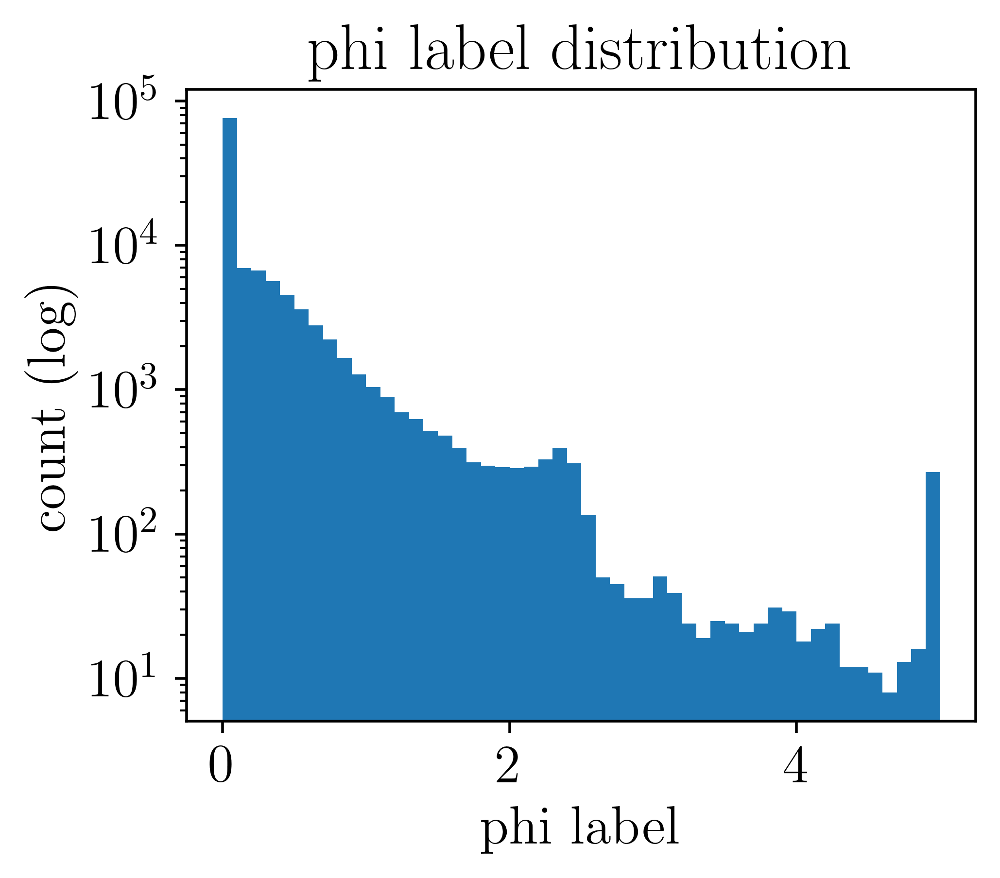

In [357]:
# ── φ label oracle: worst-case correction over uncertainty box ────────────────
PHI_MAX = 5.0   # cap labels against outliers near obstacle boundary

@ft.partial(jax.jit, static_argnames=('n_restarts', 'n_steps'))
def phi_true_fn(xhat, eps, key, n_restarts=4, n_steps=30, lr=0.05):
    """φ_i(x̂, ε) = max_{x in [x̂-ε, x̂+ε]} (Lf h_i + α h_i)(x) - (Lf h_i + α h_i)(x̂), clipped ≥ 0."""
    lo = xhat - eps
    hi = xhat + eps

    h_nom   = task.handcbf_B(xhat, hocbf_alpha)
    Lf_nom  = jax.jacobian(lambda xi: task.handcbf_B(xi, hocbf_alpha))(xhat) @ task.f(xhat)
    nom_val = Lf_nom + ALPHA_QP * h_nom   # (nh,)

    def worst_i(i, k):
        def obj(x):
            h  = task.handcbf_B(x, hocbf_alpha)
            Lf = jax.jacobian(lambda xi: task.handcbf_B(xi, hocbf_alpha))(x) @ task.f(x)
            return (Lf + ALPHA_QP * h)[i]
        _, x_wc  = proj_grad_max_box(obj, lo, hi, n_restarts, n_steps, lr, k)
        h_wc  = task.handcbf_B(x_wc, hocbf_alpha)
        Lf_wc = jax.jacobian(lambda xi: task.handcbf_B(xi, hocbf_alpha))(x_wc) @ task.f(x_wc)
        delta = (Lf_wc + ALPHA_QP * h_wc)[i] - nom_val[i]
        return jnp.clip(delta, 0.0, PHI_MAX)

    keys = jax.random.split(key, _NH)
    return jax.vmap(worst_i)(jnp.arange(_NH), keys)

# ── Generate training / test datasets ─────────────────────────────────────────
# Sample x̂ uniformly over the full state space. Points far from the obstacle
# will have φ ≈ 0; the network will learn to be non-zero only near the boundary.
# eps is sampled per-dimension from Uniform[0, EPS_MAX] so the network generalises
# across different uncertainty levels.
lb = jnp.array(task.train_bounds()[0])   # (-2.5, -2.5, -π)
ub = jnp.array(task.train_bounds()[1])   # ( 2.5,  2.5,  π)

N_TRAIN, N_TEST = 120000, 30000
# N_TRAIN, N_TEST = 12000, 3000
rng_phi         = jax.random.PRNGKey(7)
rng_phi, rng_tr, rng_te, rng_eps_tr, rng_eps_te = jax.random.split(rng_phi, 5)

xhat_train = lb + jax.random.uniform(rng_tr, (N_TRAIN, task.NX)) * (ub - lb)
xhat_test  = lb + jax.random.uniform(rng_te, (N_TEST,  task.NX)) * (ub - lb)

# Per-sample eps ~ Uniform[0, EPS_MAX] for each dimension
eps_train = jax.random.uniform(rng_eps_tr, (N_TRAIN, task.NX)) * EPS_MAX
eps_test  = jax.random.uniform(rng_eps_te, (N_TEST,  task.NX)) * EPS_MAX

keys_tr = jax.random.split(rng_phi,              N_TRAIN)
keys_te = jax.random.split(jax.random.PRNGKey(99), N_TEST)

print('Computing phi labels for training set...')
phi_train = jax.vmap(phi_true_fn)(xhat_train, eps_train, keys_tr)   # (N_TRAIN, nh)
print('Computing phi labels for test set...')
phi_test  = jax.vmap(phi_true_fn)(xhat_test,  eps_test,  keys_te)

phi_tr_np = jax2np(phi_train)
print(f'Label stats  mean={phi_tr_np.mean():.4f}  std={phi_tr_np.std():.4f}'
      f'  max={phi_tr_np.max():.4f}')
print(f'Fraction non-zero: {(phi_tr_np > 0).mean():.2%}')

# ── Quick sanity: label distribution histogram ────────────────────────────────
fig, ax = plt.subplots(figsize=(4, 3.5), layout='constrained')
ax.hist(phi_tr_np.ravel(), bins=50, log=True)
ax.set(xlabel='phi label', ylabel='count (log)', title='phi label distribution')
plt.show()


PhiNet: 1313 parameters  (input=2*3=6, output=1)
Loaded NMR-CBF weights from ../../runs/nmr_cbf_dubins3d/phi_params.pkl


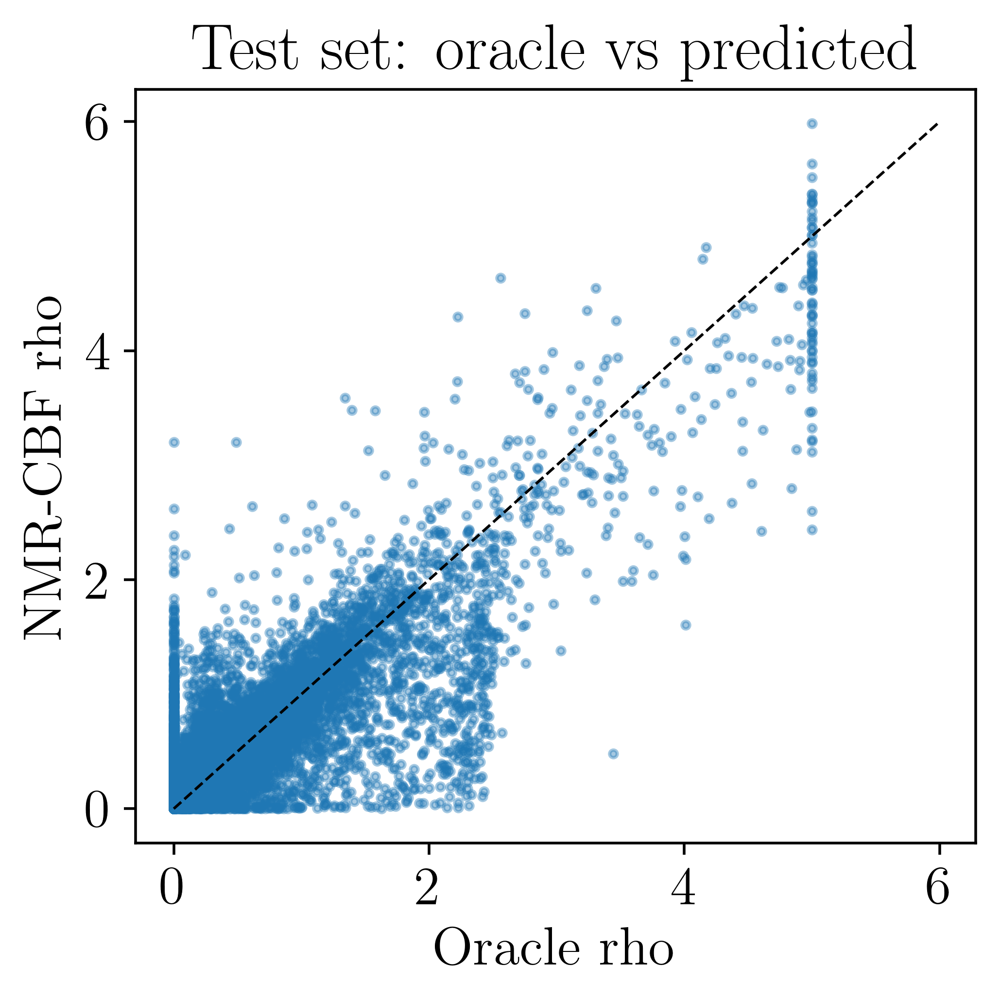

In [358]:
# ── PhiNet definition: input = (xhat, eps) ────────────────────────────────────
import os, pickle
from pathlib import Path

class PhiNet(nn.Module):
    hidden_dims: tuple = (32, 32)
    n_constraints: int = _NH

    @nn.compact
    def __call__(self, xhat, eps):
        h = jnp.concatenate([xhat, eps])   # (2*nx,)
        for d in self.hidden_dims:
            h = nn.tanh(nn.Dense(d)(h))
        return nn.softplus(nn.Dense(self.n_constraints)(h))   # phi >= 0

phi_net    = PhiNet()
phi_params = phi_net.init(jax.random.PRNGKey(0),
                          jnp.zeros(task.NX), jnp.zeros(task.NX))['params']
n_params   = sum(p.size for p in jax.tree_util.tree_leaves(phi_params))
print(f'PhiNet: {n_params} parameters  (input=2*{task.NX}={2*task.NX}, output={_NH})')

# ── Load or train ────────────────────────────────────────────────────────────
_nmr_dir = Path(NMR_WEIGHTS_DIR) if NMR_WEIGHTS_DIR else None
_nmr_weights_file = _nmr_dir / 'phi_params.pkl' if _nmr_dir else None

if _nmr_weights_file and _nmr_weights_file.exists():
    with open(_nmr_weights_file, 'rb') as _f:
        phi_params = pickle.load(_f)
    print(f'Loaded NMR-CBF weights from {_nmr_weights_file}')
else:
    optimizer = optax.adam(3e-3)
    opt_state = optimizer.init(phi_params)

    BATCH_SIZE = 256
    N_EPOCHS   = 500

    @jax.jit
    def train_step(params, opt_state, xb, eps_b, phi_b):
        def loss_fn(p):
            pred = jax.vmap(lambda x, e: phi_net.apply({'params': p}, x, e))(xb, eps_b)
            return jnp.mean((pred - phi_b) ** 2)
        loss, grads = jax.value_and_grad(loss_fn)(params)
        updates, new_opt = optimizer.update(grads, opt_state, params)
        return optax.apply_updates(params, updates), new_opt, loss

    rng_ep = jax.random.PRNGKey(42)
    losses = []
    for epoch in range(N_EPOCHS):
        rng_ep, rng_shuf = jax.random.split(rng_ep)
        perm = jax.random.permutation(rng_shuf, N_TRAIN)
        for b in range(0, N_TRAIN, BATCH_SIZE):
            idx  = perm[b : b + BATCH_SIZE]
            phi_params, opt_state, ep_loss = train_step(
                phi_params, opt_state, xhat_train[idx], eps_train[idx], phi_train[idx])
        losses.append(float(ep_loss))
        if (epoch + 1) % 100 == 0:
            pred_val  = jax.vmap(lambda x, e: phi_net.apply({'params': phi_params}, x, e))(
                xhat_test, eps_test)
            val_mse   = float(jnp.mean((pred_val - phi_test) ** 2))
            print(f'  Epoch {epoch+1:3d}  train_loss={ep_loss:.3e}  val_mse={val_mse:.3e}')

    fig, ax = plt.subplots(figsize=(6, 3), layout='constrained')
    ax.semilogy(losses)
    ax.set(xlabel='epoch', ylabel='MSE loss', title='PhiNet training')
    plt.show()

    # ── Save weights ──────────────────────────────────────────────────────────
    if _nmr_dir:
        _nmr_dir.mkdir(parents=True, exist_ok=True)
        with open(_nmr_weights_file, 'wb') as _f:
            pickle.dump(phi_params, _f)
        print(f'Saved NMR-CBF weights to {_nmr_weights_file}')

# ── Scatter: oracle vs predicted phi on test set ──────────────────────────────
pred_test = jax2np(jax.vmap(lambda x, e: phi_net.apply({'params': phi_params}, x, e))(
    xhat_test, eps_test))
fig, ax = plt.subplots(figsize=(4, 4), layout='constrained')
ax.scatter(jax2np(phi_test[:, 0]), pred_test[:, 0], s=5, alpha=0.4)
lim = max(jax2np(phi_test).max(), pred_test.max())
ax.plot([0, lim], [0, lim], 'k--', lw=0.8)
ax.set(xlabel='Oracle rho', ylabel='NMR-CBF rho', title='Test set: oracle vs predicted')
plt.show()


In [359]:
# ── NMR-CBF step function ─────────────────────────────────────────────────────
_phi_params_frozen = phi_params   # snapshot after training

def _nmr_cbf_step(carry, step_idx):
    """NMR-CBF: tighten barrier by learned phi, no online optimisation."""
    x, bias = carry
    xhat  = x + bias
    phi   = phi_net.apply({'params': _phi_params_frozen}, xhat, STATE_EPS_DUAL)   # (nh,)
    h_B   = task.handcbf_B(xhat, hocbf_alpha) + phi / ALPHA_QP   # tightened
    hx_B  = jax.jacobian(lambda xi: task.handcbf_B(xi, hocbf_alpha))(xhat)
    u_nom = task.nom_pol_goto(xhat)
    u, _, _ = min_norm_cbf(ALPHA_QP, u_lb, u_ub, h_B, hx_B,
                            task.f(xhat), task.G(xhat), u_nom, relax_eps2=0.1)
    return (x + DT * task.xdot(x, u), bias), (x, xhat)

rollout_nmr_cbf = _make_noisy_rollout(_nmr_cbf_step)
bias_test_compile = _sample_bias(BASE_KEY)
x_test_compile    = jnp.array(list(x_ics.values())[0])
rollout_nmr_cbf(x_test_compile, bias_test_compile)
print('NMR-CBF compiled.')


NMR-CBF compiled.


## GUARDIAN: HJ Reachability-based Uncertainty-Aware Filter

GUARDIAN uses Hamilton-Jacobi reachability analysis to compute a value function over the state space,
then at runtime evaluates worst-case next states over the uncertainty box against that value function
to pick the safest control input.

In [360]:
# ── GUARDIAN: HJ Dynamics wrapper for Dubins3D ────────────────────────────────
import hj_reachability as hj
from hjnnv import hjnnvUncertaintyAwareFilter

class Dubins3DHJ(hj.ControlAndDisturbanceAffineDynamics):
    """Wraps Dubins3DAvoid into the hj_reachability dynamics interface."""
    def __init__(self, vel=1.0, umax=np.pi/4, dt=0.05,
                 max_disturbance=1e-6,
                 control_mode="max", disturbance_mode="min"):
        self.vel = vel
        self.umax = umax
        self.dt = dt
        control_space = hj.sets.Box(
            jnp.array([-1.0]),    # normalized control in [-1, 1]
            jnp.array([ 1.0])
        )
        disturbance_space = hj.sets.Box(
            jnp.array([-max_disturbance, -max_disturbance, -max_disturbance]),
            jnp.array([ max_disturbance,  max_disturbance,  max_disturbance])
        )
        super().__init__(control_mode, disturbance_mode,
                         control_space, disturbance_space)

    def open_loop_dynamics(self, state, time):
        return jnp.array([
            self.vel * jnp.cos(state[2]),
            self.vel * jnp.sin(state[2]),
            0.0
        ])

    def control_jacobian(self, state, time):
        # u is normalized [-1, 1]; actual omega = umax * u
        return jnp.array([[0.0], [0.0], [self.umax]])

    def disturbance_jacobian(self, state, time):
        return jnp.eye(3)

    def step(self, state, control, disturbance, time=0.):
        """Euler step."""
        dxdt = self(state, control, disturbance, time)
        return state + dxdt * self.dt

# ── Build HJ grid and solve for value function ───────────────────────────────
N_GRID = 45   # 45^3 = ~91K grid points — feasible for 3D
hj_dynamics = Dubins3DHJ(vel=task.VEL, umax=task.umax, dt=DT)

hj_grid = hj.Grid.from_lattice_parameters_and_boundary_conditions(
    hj.sets.Box(
        np.array([-2.5, -2.5, -np.pi]),
        np.array([ 2.5,  2.5,  np.pi])
    ),
    (N_GRID, N_GRID, N_GRID),
    periodic_dims=2   # theta is periodic
)

# Initial values: obstacle constraint h(x) = r^2 - ||pos - pos_obs||^2
# Positive inside obstacle (unsafe), negative outside (safe)
# HJ convention: target set = {V <= 0} is the safe set
obs_x, obs_y = float(task.pos_obs[0]), float(task.pos_obs[1])
r_obs = task.radius_obs
hj_initial_values = (
    r_obs**2
    - (hj_grid.states[..., 0] - obs_x)**2
    - (hj_grid.states[..., 1] - obs_y)**2
)

solver_settings = hj.SolverSettings.with_accuracy(
    "very_high",
    hamiltonian_postprocessor=hj.solver.backwards_reachable_tube
)

print("Solving HJ PDE (this may take a few minutes for 3D)...")
import time as _time
_t0 = _time.time()
hj_target_values = hj.step(
    solver_settings, hj_dynamics, hj_grid,
    0.0, hj_initial_values, -5.0   # 5s backward reachable tube
)
print(f"HJ solve done in {_time.time() - _t0:.1f}s")

# ── Build GUARDIAN filter ─────────────────────────────────────────────────────
def estimation_function(obs):
    return obs   # identity estimator (direct state observation + bias)

guardian_filter = hjnnvUncertaintyAwareFilter(
    dynamics=hj_dynamics,
    pred_model=estimation_function,
    grid=hj_grid,
    initial_values=hj_initial_values,
    num_controls=30,
    num_disturbances=3,
    time_horizon=5.0
)

# ── GUARDIAN step function ────────────────────────────────────────────────────
def _guardian_step(carry, step_idx):
    """GUARDIAN: HJ reachability filter over uncertainty box."""
    x, bias = carry
    xhat = x + bias
    state_bounds = hj.sets.Box(xhat - STATE_EPS_DUAL, xhat + STATE_EPS_DUAL)
    u_nom = task.nom_pol_goto(xhat)

    _, u_star, _, val_filter, _, _, _, _ = guardian_filter.ua_filter_best_u(
        u_nom, state_bounds, num_states=5, delta=0.01
    )
    # Use filtered control if value is negative (unsafe), else nominal
    u = jnp.where(val_filter < 0.0, u_star, u_nom)
    return (x + DT * task.xdot(x, u), bias), (x, xhat)

rollout_guardian = _make_noisy_rollout(_guardian_step)
rollout_guardian(x_test_compile, bias_test_compile)
print("GUARDIAN compiled.")


Solving HJ PDE (this may take a few minutes for 3D)...


100%|##########|  5.0000/5.0 [00:00<00:00, 89.48sim_s/s]


HJ solve done in 2.7s


100%|##########|  5.0000/5.0 [00:00<00:00, 71.82sim_s/s]


GUARDIAN compiled.


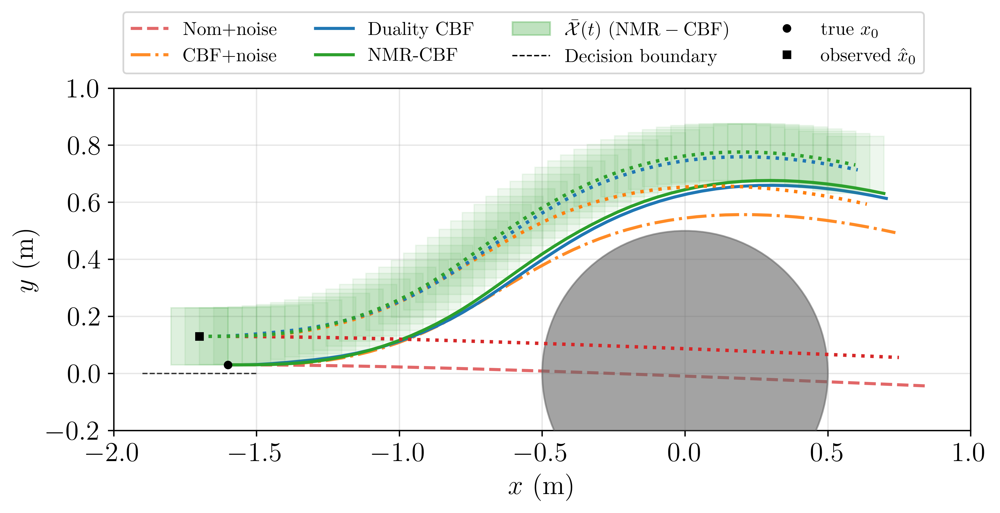

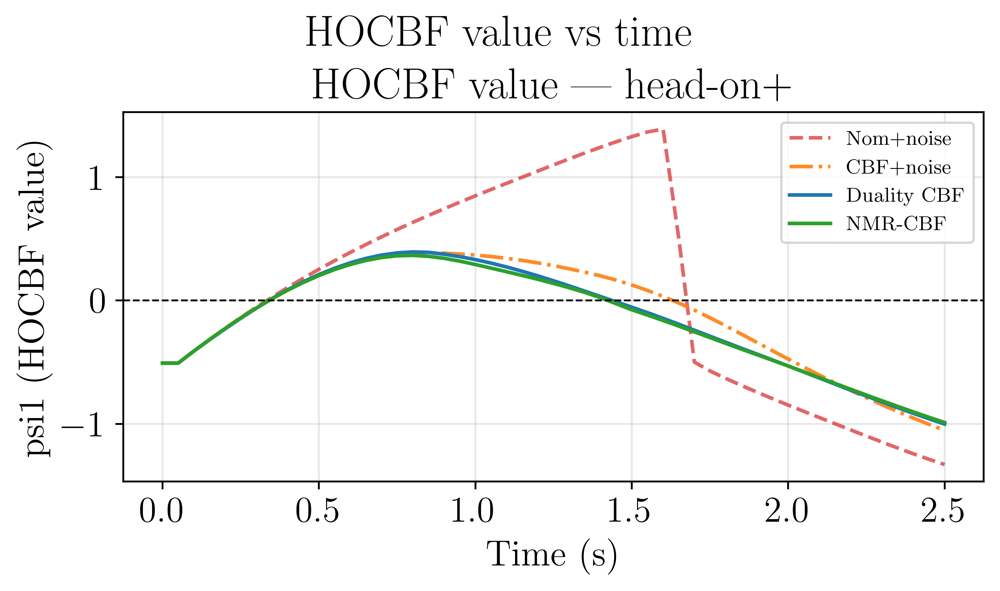

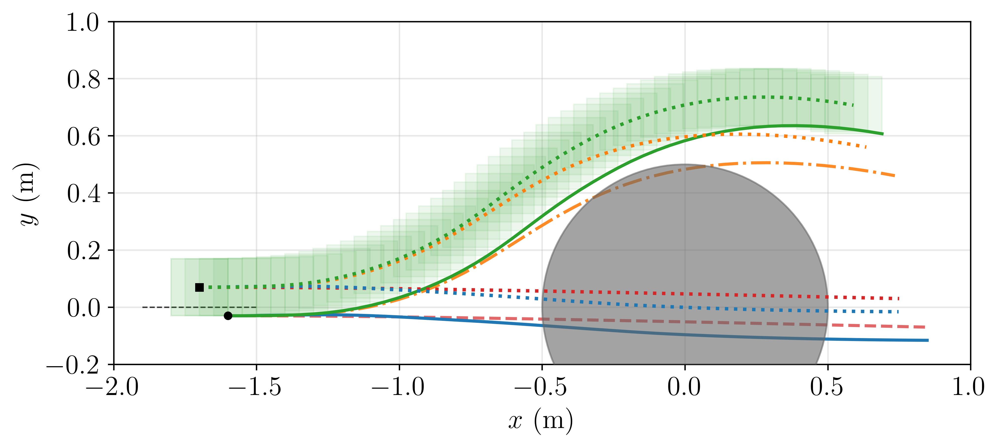

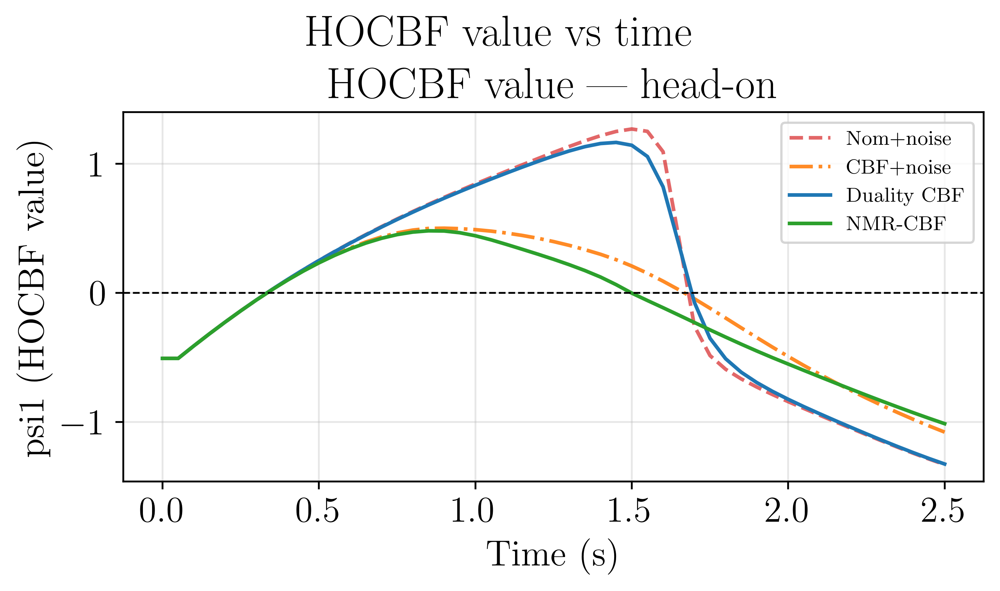

In [361]:
# ── Sample one fixed bias per IC (same bias for all three policies on each IC)
bias_per_ic = {
    name: _sample_bias(jax.random.fold_in(BASE_KEY, i))
    for i, name in enumerate(x_ics.keys())
}

pol_styles = [
    ('Nom+noise',   rollout_nom_noisy, '--', 'C3', 0.7),
    ('CBF+noise',   rollout_cbf_noisy, '-.',  'C1', 0.9),
    # ('R-CBF-QP',    rollout_rcbf,      ':',   'C4', 1.0),
    ('Duality CBF', rollout_duality,   '-',   'C0', 1.0),
    # ('R-CBF (0.2)', rollout_rcbf_02,   '--',  'C6', 0.9),
    # ('R-CBF (1.0)', rollout_rcbf_10,   '--',  'C7', 0.9),
    ('NMR-CBF',     rollout_nmr_cbf,   '-',   'C2', 1.0),
    # ('GUARDIAN',     rollout_guardian,   '-',   'C5', 1.0),
    # ('NMR+RCBF',    rollout_nmr_rcbf,  '-',   'C6', 1.0),
]

def plot_one_ic(ic_name, plot_legend=True):
    x0 = x_ics[ic_name]
    # x0 = x_ics['head-on+']

    # Fixed bias at maximum noise in the [-x, +y, +theta] direction
    bias    = jnp.array([-STATE_EPS_DUAL[0], STATE_EPS_DUAL[1], STATE_EPS_DUAL[2]*0.0])
    bias_np = jax2np(bias)

    fig_traj, ax_t = plt.subplots(1, 1, figsize=(8, 6), layout='constrained')
    fig_cbf,  ax_c = plt.subplots(1, 1, figsize=(6.0, 3.5), layout='constrained')

    t_arr  = np.arange(T + 1) * DT
    h_vmap = jax.jit(jax.vmap(lambda xi: task.handcbf_B(xi, hocbf_alpha)))

    trajs = {}
    obs_p = plt.Circle((float(task.pos_obs[0]), float(task.pos_obs[1])),
                    task.radius_obs, color='0.4', alpha=0.6, zorder=3)
    ax_t.add_patch(obs_p)

    for pol_name, rollout_fn, ls, col, alpha in pol_styles:
        xs_full, _ = jax2np(rollout_fn(jnp.array(x0), bias))
        trajs[(ic_name, pol_name)] = xs_full

        ax_t.plot(xs_full[:, 0], xs_full[:, 1], ls=ls, color=col, lw=1.8, alpha=alpha, label=pol_name)

        psi1 = jax2np(h_vmap(jnp.array(xs_full)))[:, 0]
        ax_c.plot(t_arr, psi1, ls=ls, color=col, lw=1.6, alpha=alpha, label=pol_name)

    # ── Uncertainty boxes: centred on xhat = x_true + bias ───────────────────────
    # STRIDE = max(1, T // 25)
    STRIDE = 1
    ex = float(STATE_EPS_DUAL[0])
    ey = float(STATE_EPS_DUAL[1])

    for pol_name, _, ls, col, _ in pol_styles:
        xs_full   = trajs[(ic_name, pol_name)]
        xhat_traj = xs_full + bias_np[None, :]
        ax_t.plot(xhat_traj[:, 0], xhat_traj[:, 1],
                ls=':', color=col, lw=2.0, alpha=1.0, zorder=3)
        for t in range(0, len(xs_full), STRIDE):
            cx = xhat_traj[t, 0]
            cy = xhat_traj[t, 1]
            rect = mpatches.Rectangle(
                (cx - ex, cy - ey), 2*ex, 2*ey,
                linewidth=0.8, edgecolor=col, facecolor=col,
                alpha=0.08, zorder=2
            )
            if pol_name == 'NMR-CBF':
                ax_t.add_patch(rect)

    # Decision boundary
    ax_t.plot([-1.9, -1.5], [0.0, 0.0], 'k--', lw=0.8, zorder=1, label='Decision boundary')

    # IC markers
    x0_hat = jnp.array(x0) + bias
    ax_t.plot(*jnp.array(x0)[:2], 'ko', ms=4, zorder=6, label=r'$\mathrm{true}\ x_0$')
    ax_t.plot(*jax2np(x0_hat)[:2], 'ks', ms=4, zorder=6, label=r'$\mathrm{observed}\ \hat{x}_0$')

    ax_t.set(
        xlim=(-2.0, 1.0), ylim=(-0.2, 1.0), aspect='equal',
        xlabel=rf'$x$ (m)', ylabel=rf'$y$ (m)',
        # title=f'{ic_name} — bias=(-eps_x, +eps_y, +eps_theta)'
    )
    ax_t.grid(alpha=0.3)

    from matplotlib.patches import Patch
    extra = [Patch(facecolor='C2', edgecolor='C2', alpha=0.3, label=r'$\bar{\mathcal{X}}(t)$')]
    handles, labels = ax_t.get_legend_handles_labels()
    handles.insert(4, extra[0])
    labels.insert(4, r'$\bar{\mathcal{X}}(t)\ \mathrm{(NMR-CBF)}$')
    if plot_legend:
        ax_t.legend(handles, labels, fontsize=11, loc='upper left', ncol=4, bbox_to_anchor=(0.0, 1.25))

    ax_c.axhline(0, color='k', lw=0.8, ls='--')
    ax_c.set(xlabel='Time (s)', ylabel='psi1 (HOCBF value)', title=f'HOCBF value — {ic_name}')
    ax_c.legend(fontsize=9, loc='upper right')
    ax_c.grid(alpha=0.3)

    # fig_traj.suptitle(f'Trajectory with uncertainty boxes  (eps_x={ex:.2f} m, eps_y={ey:.2f} m, bias=-eps_x/+eps_y/+eps_theta)')
    fig_cbf.suptitle('HOCBF value vs time')
    plt.show()

plot_one_ic('head-on+')
plot_one_ic('head-on', plot_legend=False)


Compiling duality diagnostic...
  done


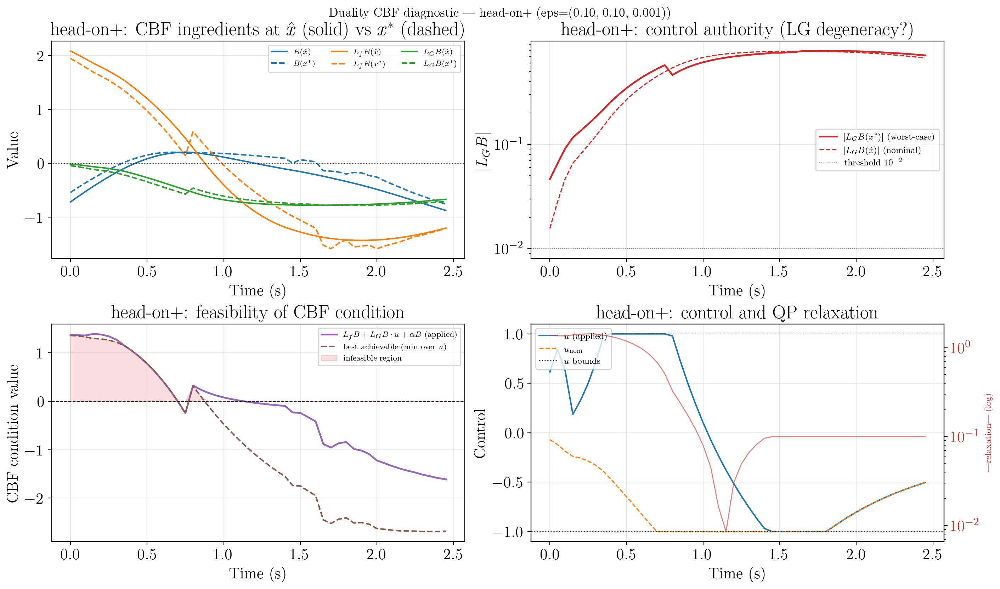


head-on+ diagnosis (50 steps):
  |LG(x*)| < 0.01 (degenerate):  0/50  (0%)
  CBF infeasible (best > 0):      17/50  (34%)
  max |relaxation|:               1.4338



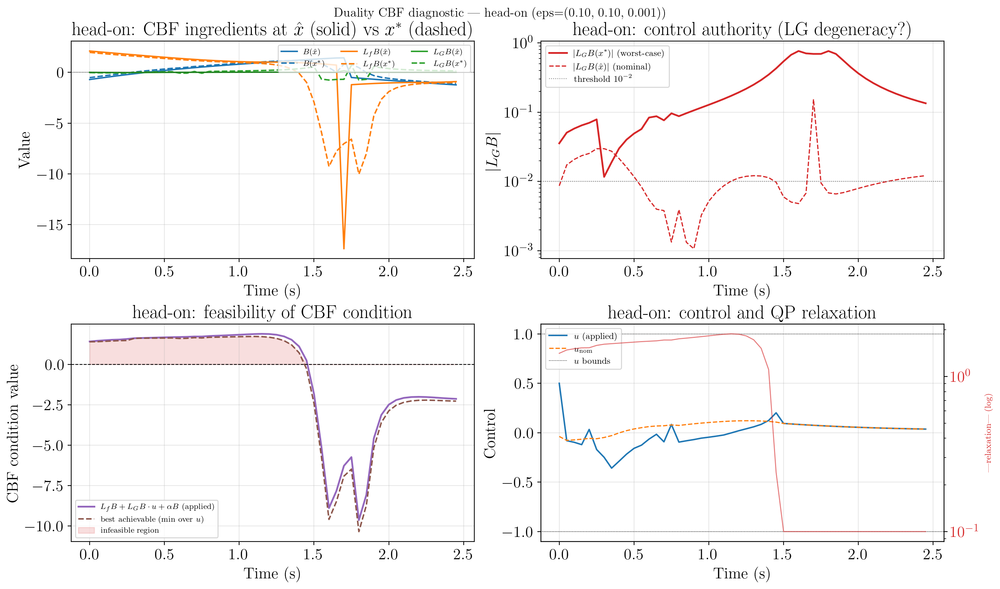


head-on diagnosis (50 steps):
  |LG(x*)| < 0.01 (degenerate):  0/50  (0%)
  CBF infeasible (best > 0):      29/50  (58%)
  max |relaxation|:               1.8863



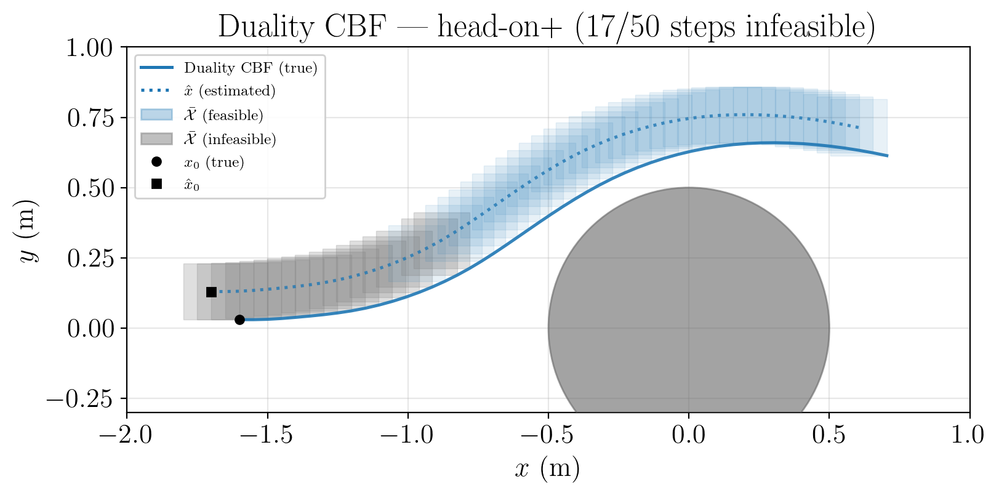

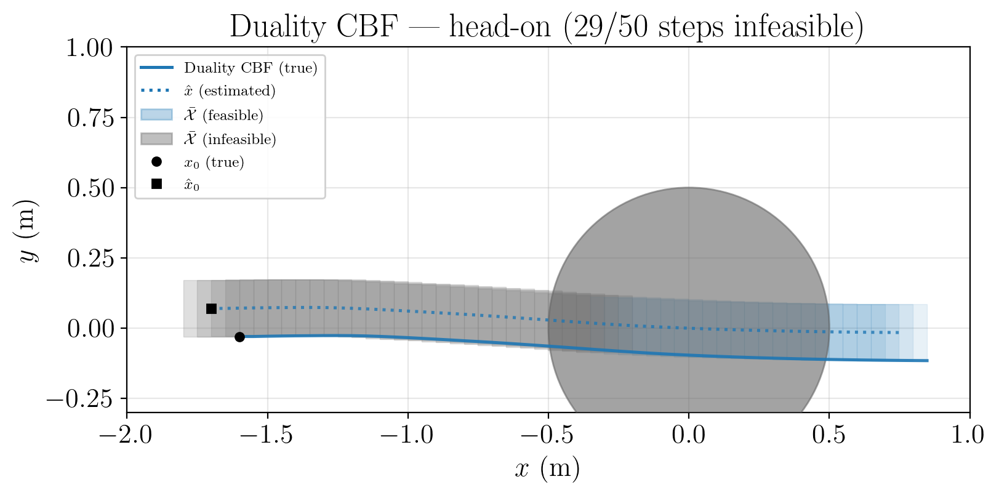

: 

In [ ]:
# ── Duality CBF diagnostic: worst-case CBF ingredients over time ──────────────
# For each IC, step through the duality rollout manually and record at each time:
#   - The worst-case x* found by projected gradient ascent
#   - h(x*), Lf_h(x*), LG_h(x*) at x*
#   - The applied control and the CBF condition value
# This helps diagnose whether failures come from:
#   (A) Total infeasibility — no u satisfies the CBF condition, or
#   (B) LG h ≈ 0 degeneracy — the worst-case x* has vanishing control authority.

@jax.jit
def _duality_step_diag(carry, step_idx):
    """Like _duality_step but returns full diagnostic info."""
    x, bias = carry
    xhat = x + bias
    lo   = xhat - STATE_EPS_DUAL
    hi   = xhat + STATE_EPS_DUAL
    u_nom = task.nom_pol_goto(xhat)

    opt_key  = jax.random.fold_in(BASE_KEY, step_idx)
    all_keys = jax.random.split(opt_key, N_PLANES_DUAL)

    def _worst_one(d_vec, k_j):
        def _obj(xi):
            h, Lf_h, LG_h = _cbf_ingredients(xi)
            return d_vec[0] * LG_h[0, 0] + d_vec[1] * (Lf_h[0] + ALPHA_QP * h[0])
        _, x_star = proj_grad_max_box(_obj, lo, hi, n_restarts=4, n_steps=25, lr=0.05, key=k_j)
        h_s, Lf_s, LG_s = _cbf_ingredients(x_star)
        return x_star, h_s[0], Lf_s[0], LG_s[0]   # shape (nu,) → vmap gives (N_PLANES, nu)

    xstars, h_all, Lf_all, LG_all = jax.vmap(_worst_one)(jnp.array(_DUAL_DIRS), all_keys)

    # Also compute ingredients at the nominal (estimated) state
    h_nom, Lf_nom, LG_nom = _cbf_ingredients(xhat)

    # Solve the QP
    u, relax, _ = gcbf_qp(ALPHA_QP, u_lb, u_ub, h_all, Lf_all, LG_all,
                           u_nom, relax_eps2=0.1)

    # CBF condition at worst-case point with applied u:
    # Lf_h + LG_h * u + alpha * h  (should be <= 0 for safety)
    cbf_cond_wc = Lf_all + (LG_all @ u) + ALPHA_QP * h_all   # (N_PLANES,) per dual direction

    x_next = x + DT * task.xdot(x, u)
    diag = {
        'x_true':    x,
        'xhat':      xhat,
        'u_nom':     u_nom,
        'u_applied': u,
        'relax':     relax,
        # Worst-case (per dual direction — pick the one with largest h)
        'xstars':    xstars,      # (N_PLANES, nx)
        'h_wc':      h_all,       # (N_PLANES,)
        'Lf_wc':     Lf_all,      # (N_PLANES,)
        'LG_wc':     LG_all,      # (N_PLANES, nu)
        'cbf_cond':  cbf_cond_wc, # (N_PLANES,)
        # Nominal (at xhat)
        'h_nom':     h_nom[0],
        'Lf_nom':    Lf_nom[0],
        'LG_nom':    LG_nom[0, 0],   # scalar
    }
    return (x_next, bias), diag

def _run_duality_diag(x0, bias):
    _, diag = jax.lax.scan(_duality_step_diag, (x0, bias), jnp.arange(T))
    return diag

_run_duality_diag_jit = jax.jit(_run_duality_diag)
print("Compiling duality diagnostic...")
_ = _run_duality_diag_jit(jnp.array(list(x_ics.values())[0]),
                           jnp.array([-STATE_EPS_DUAL[0], STATE_EPS_DUAL[1], 0.0]))
print("  done")

# ── Plot diagnostic for each IC ──────────────────────────────────────────────
for ic_name in ['head-on+', 'head-on']:
    x0   = x_ics[ic_name]
    bias = jnp.array([-STATE_EPS_DUAL[0], STATE_EPS_DUAL[1], STATE_EPS_DUAL[2] * 0.0])
    diag = jax2np(_run_duality_diag_jit(jnp.array(x0), bias))

    t_arr = np.arange(T) * DT

    fig, axes = plt.subplots(2, 2, figsize=(14, 8), layout='constrained')

    # --- Panel (0,0): h, Lf, LG at worst-case point vs at xhat ---
    ax = axes[0, 0]
    # Pick the dual direction with the largest h (most dangerous)
    worst_dir = np.argmax(diag['h_wc'], axis=1)  # (T,)
    h_wc_main  = np.array([diag['h_wc'][t, worst_dir[t]] for t in range(T)])
    Lf_wc_main = np.array([diag['Lf_wc'][t, worst_dir[t]] for t in range(T)])
    LG_wc_main = np.array([diag['LG_wc'][t, worst_dir[t], 0] for t in range(T)])

    ax.plot(t_arr, diag['h_nom'],  '-',  color='C0', lw=1.5, label=r'$B(\hat{x})$')
    ax.plot(t_arr, h_wc_main,      '--', color='C0', lw=1.5, label=r'$B(x^*)$')
    ax.plot(t_arr, diag['Lf_nom'], '-',  color='C1', lw=1.5, label=r'$L_f B(\hat{x})$')
    ax.plot(t_arr, Lf_wc_main,     '--', color='C1', lw=1.5, label=r'$L_f B(x^*)$')
    ax.plot(t_arr, diag['LG_nom'], '-',  color='C2', lw=1.5, label=r'$L_G B(\hat{x})$')
    ax.plot(t_arr, LG_wc_main,     '--', color='C2', lw=1.5, label=r'$L_G B(x^*)$')
    ax.axhline(0, color='k', lw=0.6, ls=':')
    ax.set(xlabel='Time (s)', ylabel='Value',
           title=f'{ic_name}: CBF ingredients at $\\hat{{x}}$ (solid) vs $x^*$ (dashed)')
    ax.legend(fontsize=8, ncol=3, loc='upper right')
    ax.grid(alpha=0.3)

    # --- Panel (0,1): |LG_h| at worst-case — test for degeneracy ---
    ax = axes[0, 1]
    ax.semilogy(t_arr, np.abs(LG_wc_main), '-', color='C3', lw=1.8, label=r'$|L_G B(x^*)|$ (worst-case)')
    ax.semilogy(t_arr, np.abs(diag['LG_nom']), '--', color='C3', lw=1.2, label=r'$|L_G B(\hat{x})|$ (nominal)')
    ax.axhline(1e-2, color='gray', ls=':', lw=0.8, label=r'threshold $10^{-2}$')
    ax.set(xlabel='Time (s)', ylabel=r'$|L_G B|$',
           title=f'{ic_name}: control authority (LG degeneracy?)')
    ax.legend(fontsize=9)
    ax.grid(alpha=0.3)

    # --- Panel (1,0): CBF condition and feasibility ---
    ax = axes[1, 0]
    # The CBF condition: Lf + LG*u + alpha*h <= 0 for safety
    # If the best we can achieve (u at saturation) still gives > 0, it's infeasible
    # Compute the minimum possible condition value: min_u (Lf + LG*u + alpha*h) with u in [u_lb, u_ub]
    u_lb_val = float(u_lb[0])
    u_ub_val = float(u_ub[0])
    # min_u LG*u = LG * u_lb if LG > 0, else LG * u_ub
    best_LGu = np.where(LG_wc_main > 0, LG_wc_main * u_lb_val, LG_wc_main * u_ub_val)
    cbf_best = Lf_wc_main + best_LGu + ALPHA_QP * h_wc_main  # best achievable condition
    cbf_applied = np.array([diag['cbf_cond'][t, worst_dir[t]] for t in range(T)])

    ax.plot(t_arr, cbf_applied, '-', color='C4', lw=1.8, label=r'$L_fB + L_GB\cdot u + \alpha B$ (applied)')
    ax.plot(t_arr, cbf_best,    '--', color='C5', lw=1.5, label=r'best achievable (min over $u$)')
    ax.fill_between(t_arr, 0, np.maximum(cbf_best, 0), color='C3', alpha=0.15, label='infeasible region')
    ax.axhline(0, color='k', lw=0.8, ls='--')
    ax.set(xlabel='Time (s)', ylabel='CBF condition value',
           title=f'{ic_name}: feasibility of CBF condition')
    ax.legend(fontsize=8, loc='best')
    ax.grid(alpha=0.3)

    # --- Panel (1,1): applied u, u_nom, and relaxation ---
    ax = axes[1, 1]
    ax.plot(t_arr, diag['u_applied'][:, 0], '-',  color='C0', lw=1.5, label=r'$u$ (applied)')
    ax.plot(t_arr, diag['u_nom'][:, 0],     '--', color='C1', lw=1.2, label=r'$u_{\mathrm{nom}}$')
    ax.axhline(u_lb_val, color='k', ls=':', lw=0.6)
    ax.axhline(u_ub_val, color='k', ls=':', lw=0.6, label='$u$ bounds')
    ax2 = ax.twinx()
    ax2.semilogy(t_arr, np.abs(diag['relax']), '-', color='C3', lw=1.0, alpha=0.6)
    ax2.set_ylabel('|relaxation| (log)', color='C3', fontsize=9)
    ax2.tick_params(axis='y', labelcolor='C3')
    ax.set(xlabel='Time (s)', ylabel='Control',
           title=f'{ic_name}: control and QP relaxation')
    ax.legend(fontsize=9, loc='upper left')
    ax.grid(alpha=0.3)

    fig.suptitle(f'Duality CBF diagnostic — {ic_name} (eps=({float(STATE_EPS_DUAL[0]):.2f}, {float(STATE_EPS_DUAL[1]):.2f}, {float(STATE_EPS_DUAL[2]):.3f}))',
                 fontsize=13, y=1.02)
    plt.show()

    # Summary diagnosis
    n_lg_degenerate = (np.abs(LG_wc_main) < 1e-2).sum()
    n_infeasible    = (cbf_best > 0).sum()
    print(f"\n{ic_name} diagnosis ({T} steps):")
    print(f"  |LG(x*)| < 0.01 (degenerate):  {n_lg_degenerate}/{T}  ({100*n_lg_degenerate/T:.0f}%)")
    print(f"  CBF infeasible (best > 0):      {n_infeasible}/{T}  ({100*n_infeasible/T:.0f}%)")
    print(f"  max |relaxation|:               {np.abs(diag['relax']).max():.4f}")
    print()


# ── Trajectory with feasibility-coloured uncertainty rectangles ───────────────
for ic_name in ['head-on+', 'head-on']:
    x0   = x_ics[ic_name]
    bias = jnp.array([-STATE_EPS_DUAL[0], STATE_EPS_DUAL[1], STATE_EPS_DUAL[2] * 0.0])
    diag = jax2np(_run_duality_diag_jit(jnp.array(x0), bias))

    # Reconstruct trajectory from diagnostics
    xs_true = diag['x_true']       # (T, nx)
    xhats   = diag['xhat']         # (T, nx)

    # Determine feasibility at each step
    worst_dir = np.argmax(diag['h_wc'], axis=1)
    h_wc_main  = np.array([diag['h_wc'][t, worst_dir[t]] for t in range(T)])
    Lf_wc_main = np.array([diag['Lf_wc'][t, worst_dir[t]] for t in range(T)])
    LG_wc_main = np.array([diag['LG_wc'][t, worst_dir[t], 0] for t in range(T)])
    u_lb_val = float(u_lb[0])
    u_ub_val = float(u_ub[0])
    best_LGu = np.where(LG_wc_main > 0, LG_wc_main * u_lb_val, LG_wc_main * u_ub_val)
    cbf_best = Lf_wc_main + best_LGu + ALPHA_QP * h_wc_main
    infeasible = cbf_best > 0  # (T,) bool

    ex = float(STATE_EPS_DUAL[0])
    ey = float(STATE_EPS_DUAL[1])

    fig, ax = plt.subplots(figsize=(8, 6), layout='constrained')

    # Obstacle
    obs_p = plt.Circle((float(task.pos_obs[0]), float(task.pos_obs[1])),
                        task.radius_obs, color='0.4', alpha=0.6, zorder=3)
    ax.add_patch(obs_p)

    # Uncertainty rectangles — grey if infeasible, blue if feasible
    for t in range(T):
        cx, cy = xhats[t, 0], xhats[t, 1]
        if infeasible[t]:
            rect_color = '0.5'
            rect_alpha = 0.25
        else:
            rect_color = 'C0'
            rect_alpha = 0.10
        rect = mpatches.Rectangle(
            (cx - ex, cy - ey), 2*ex, 2*ey,
            linewidth=0.5, edgecolor=rect_color, facecolor=rect_color,
            alpha=rect_alpha, zorder=2
        )
        ax.add_patch(rect)

    # True trajectory
    ax.plot(xs_true[:, 0], xs_true[:, 1], '-', color='C0', lw=1.8, alpha=0.9,
            label='Duality CBF (true)', zorder=4)
    # Estimated trajectory
    ax.plot(xhats[:, 0], xhats[:, 1], ':', color='C0', lw=1.8, alpha=0.8,
            label=r'$\hat{x}$ (estimated)', zorder=4)

    # IC markers
    ax.plot(xs_true[0, 0], xs_true[0, 1], 'ko', ms=5, zorder=6, label=r'$x_0$ (true)')
    ax.plot(xhats[0, 0], xhats[0, 1], 'ks', ms=5, zorder=6, label=r'$\hat{x}_0$')

    # Legend proxies for rectangle colours
    from matplotlib.patches import Patch
    ax.legend(
        handles=[
            plt.Line2D([], [], color='C0', lw=1.8, label='Duality CBF (true)'),
            plt.Line2D([], [], color='C0', lw=1.8, ls=':', label=r'$\hat{x}$ (estimated)'),
            Patch(facecolor='C0', edgecolor='C0', alpha=0.3, label=r'$\bar{\mathcal{X}}$ (feasible)'),
            Patch(facecolor='0.5', edgecolor='0.5', alpha=0.5, label=r'$\bar{\mathcal{X}}$ (infeasible)'),
            plt.Line2D([], [], marker='o', color='k', ls='', ms=5, label=r'$x_0$ (true)'),
            plt.Line2D([], [], marker='s', color='k', ls='', ms=5, label=r'$\hat{x}_0$'),
        ],
        fontsize=9, loc='upper left', framealpha=0.9
    )

    n_inf = infeasible.sum()
    ax.set(xlim=(-2.0, 1.0), ylim=(-0.3, 1.0), aspect='equal',
           xlabel='$x$ (m)', ylabel='$y$ (m)',
           title=f'Duality CBF — {ic_name}  ({n_inf}/{T} steps infeasible)')
    ax.grid(alpha=0.3)
    plt.show()


## Monte Carlo safety evaluation (N = 1000)

Sample initial conditions uniformly from a region approaching the obstacle, filter to those inside the CBF-invariant set (`handcbf_B(x0) < 0`), and check **true** safety (`h_components > 0` at any timestep = collision).

Candidates: 1500000
  outside obstacle:       1500000  (100.0%)
  inside CBF set (psi<0): 750882  (50.1%)
  both (usable):          750882  (50.1%)
Using 100000 ICs: outside obstacle AND handcbf_B < 0
Bias stats: mean=0.033 m,  max=0.100 m
Compiling + running Monte Carlo rollouts...
  Nom+noise done.
  CBF+noise done.
  R-CBF-QP done.
  Duality CBF done.
  R-CBF (0.2) done.
  R-CBF (1.0) done.
  NMR-CBF done.
    GUARDIAN batch 0/100...
    GUARDIAN batch 10/100...
    GUARDIAN batch 20/100...
    GUARDIAN batch 30/100...
    GUARDIAN batch 40/100...
    GUARDIAN batch 50/100...
    GUARDIAN batch 60/100...
    GUARDIAN batch 70/100...
    GUARDIAN batch 80/100...
    GUARDIAN batch 90/100...
  GUARDIAN done.
Evaluating safety...
  Nom+noise       100000/100000  100.0%  95% CI [100.0%, 100.0%]
  CBF+noise       6944/100000    6.9%  95% CI [6.8%, 7.1%]
  R-CBF-QP        2543/100000    2.5%  95% CI [2.4%, 2.6%]
  Duality CBF     13423/100000   13.4%  95% CI [13.2%, 13.6%]
  R-CBF (0.2)  

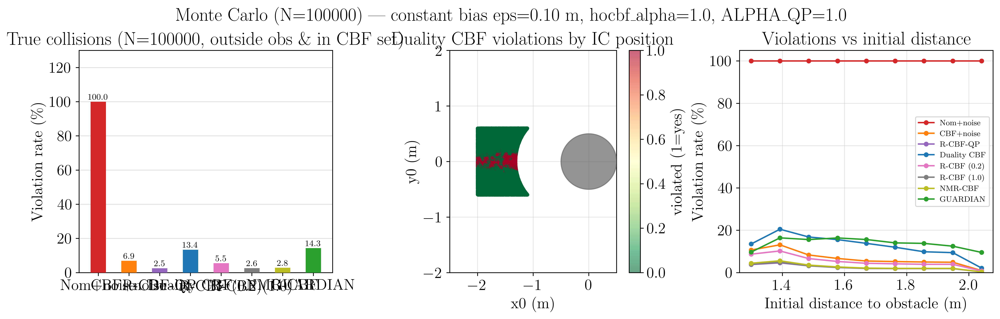

In [362]:
# ── Sample candidates ─────────────────────────────────────────────────────────
N_MC   = 100_000
# N_MC   = 50
N_CAND = 1_500_000
rng_mc = np.random.default_rng(42)

# Approach from the left half-plane with varied heading
px_cand    = rng_mc.uniform(-2.0, -0.5, N_CAND)
py_cand    = rng_mc.uniform(-0.6, 0.6, N_CAND)
theta_cand = rng_mc.uniform(-np.pi/600, np.pi/600, N_CAND)

x0s_cand = jnp.array(np.stack([px_cand, py_cand, theta_cand], axis=1), dtype=jnp.float32)

# ── Filter: (1) outside obstacle  AND  (2) inside CBF-invariant set ──────────
h0_cand = jax2np(jax.vmap(task.h_components)(x0s_cand))
B0_cand = jax2np(jax.vmap(task.handcbf_B, in_axes=(0, None))(x0s_cand, hocbf_alpha))

outside_obs = h0_cand.max(axis=1) < 0
in_cbf_set  = B0_cand.max(axis=1) < 0
safe_mask   = outside_obs & in_cbf_set

n_safe = safe_mask.sum()
print(f"Candidates: {N_CAND}")
print(f"  outside obstacle:       {outside_obs.sum():5}  ({100*outside_obs.mean():.1f}%)")
print(f"  inside CBF set (psi<0): {in_cbf_set.sum():5}  ({100*in_cbf_set.mean():.1f}%)")
print(f"  both (usable):          {n_safe:5}  ({100*n_safe/N_CAND:.1f}%)")
assert n_safe >= N_MC, f"Too few safe ICs ({n_safe}); increase N_CAND."

safe_idx = np.where(safe_mask)[0][:N_MC]
x0s_mc   = x0s_cand[safe_idx]
px_mc    = px_cand[safe_idx]
py_mc    = py_cand[safe_idx]
print(f"Using {N_MC} ICs: outside obstacle AND handcbf_B < 0")

# ── Sample one independent bias per trajectory ────────────────────────────────
bias_keys = jax.random.split(jax.random.PRNGKey(99), N_MC)
mc_biases = jax.vmap(_sample_bias)(bias_keys)   # (N_MC, nx)
print(f"Bias stats: mean={float(jnp.abs(mc_biases).mean()):.3f} m,  "
      f"max={float(jnp.abs(mc_biases).max()):.3f} m")

# ── Run MC rollouts ───────────────────────────────────────────────────────────
mc_rollout_nom     = jax.jit(jax.vmap(rollout_nom_noisy))
mc_rollout_cbf     = jax.jit(jax.vmap(rollout_cbf_noisy))
mc_rollout_rcbf    = jax.jit(jax.vmap(rollout_rcbf))
mc_rollout_duality = jax.jit(jax.vmap(rollout_duality))
mc_rollout_rcbf_02 = jax.jit(jax.vmap(rollout_rcbf_02))
mc_rollout_rcbf_10 = jax.jit(jax.vmap(rollout_rcbf_10))
# MR-CBF uses cvxpy (Python loop), so batch manually
MC_MRCBF_BATCH = 50
def mc_rollout_mrcbf(x0s, biases):
    xs_chunks, xh_chunks = [], []
    for i in range(x0s.shape[0]):
        xs_c, xh_c = _mrcbf_rollout(x0s[i], biases[i])
        xs_chunks.append(xs_c)
        xh_chunks.append(xh_c)
        if i % 500 == 0:
            print(f'    MR-CBF {i}/{x0s.shape[0]}...')
    return jnp.stack(xs_chunks), jnp.stack(xh_chunks)
mc_rollout_nmr     = jax.jit(jax.vmap(rollout_nmr_cbf))
# GUARDIAN is too memory-heavy to vmap over all N_MC at once
# (each step evaluates num_controls x num_states x num_disturbances).
# Batch in chunks instead.
MC_GUARDIAN_BATCH = 1000
_guardian_vmap = jax.jit(jax.vmap(rollout_guardian))
def mc_rollout_guardian(x0s, biases):
    xs_chunks, xh_chunks = [], []
    for i in range(0, x0s.shape[0], MC_GUARDIAN_BATCH):
        xs_c, xh_c = _guardian_vmap(x0s[i:i+MC_GUARDIAN_BATCH],
                                     biases[i:i+MC_GUARDIAN_BATCH])
        xs_chunks.append(xs_c)
        xh_chunks.append(xh_c)
        if (i // MC_GUARDIAN_BATCH) % 10 == 0:
            print(f'    GUARDIAN batch {i//MC_GUARDIAN_BATCH}/{x0s.shape[0]//MC_GUARDIAN_BATCH}...')
    return jnp.concatenate(xs_chunks), jnp.concatenate(xh_chunks)
# mc_rollout_nmr_rcbf = jax.jit(jax.vmap(rollout_nmr_rcbf))

print("Compiling + running Monte Carlo rollouts...")
mc_trajs = {}
for pol_name, mc_fn in [('Nom+noise',   mc_rollout_nom),
                         ('CBF+noise',   mc_rollout_cbf),
                         ('R-CBF-QP',    mc_rollout_rcbf),
                         ('Duality CBF', mc_rollout_duality),
                         ('R-CBF (0.2)', mc_rollout_rcbf_02),
                         ('R-CBF (1.0)', mc_rollout_rcbf_10),
                        #  ('MR-CBF',      mc_rollout_mrcbf),
                         ('NMR-CBF',     mc_rollout_nmr),
                         ('GUARDIAN',     mc_rollout_guardian),
                        #  ('NMR+RCBF',    mc_rollout_nmr_rcbf)
                         ]:
    xs_all, _ = jax2np(mc_fn(x0s_mc, mc_biases))   # (N_MC, T+1, nx)
    mc_trajs[pol_name] = xs_all
    print(f"  {pol_name} done.")

# ── True safety check ─────────────────────────────────────────────────────────
print("Evaluating safety...")
h_vmap_mc = jax.jit(jax.vmap(jax.vmap(task.h_components)))

mc_results = {}
for pol_name, xs_all in mc_trajs.items():
    h_all    = jax2np(h_vmap_mc(jnp.array(xs_all)))
    violated = h_all.max(axis=(1, 2)) > 0
    mc_results[pol_name] = violated
    n_viol = violated.sum()
    rate   = n_viol / N_MC
    z      = 1.96
    lo_ci = (rate + z**2/(2*N_MC) - z*np.sqrt(rate*(1-rate)/N_MC + z**2/(4*N_MC**2))) / (1 + z**2/N_MC)
    hi_ci = (rate + z**2/(2*N_MC) + z*np.sqrt(rate*(1-rate)/N_MC + z**2/(4*N_MC**2))) / (1 + z**2/N_MC)
    print(f"  {pol_name:<14}  {n_viol:4}/{N_MC}  {100*rate:5.1f}%  "
          f"95% CI [{100*lo_ci:.1f}%, {100*hi_ci:.1f}%]")

# ── Plots ─────────────────────────────────────────────────────────────────────
pol_names  = list(mc_results.keys())
pol_colors = ['C3', 'C1', 'C4', 'C0', 'C6', 'C7', 'C8', 'C2', 'C5', 'C9']
rates = [mc_results[n].mean() for n in pol_names]

fig, axes = plt.subplots(1, 3, figsize=(14, 4.5), layout='constrained')

axes[0].bar(pol_names, [100*r for r in rates], color=pol_colors, width=0.5, zorder=3)
axes[0].set(ylabel='Violation rate (\\%)',
            title=f'True collisions (N={N_MC}, outside obs \& in CBF set)')
axes[0].set_ylim(0, max(100*max(rates)*1.3, 3))
axes[0].grid(axis='y', alpha=0.4, zorder=0)
for i, r in enumerate(rates):
    axes[0].text(i, 100*r + 0.15, f'{100*r:.1f}%', ha='center', va='bottom', fontsize=9)

viol_dual = mc_results['Duality CBF'].astype(float)
obs_p = plt.Circle((float(task.pos_obs[0]), float(task.pos_obs[1])),
                    task.radius_obs, color='0.4', alpha=0.7, zorder=4)
axes[1].add_patch(obs_p)
sc = axes[1].scatter(px_mc, py_mc, c=viol_dual, cmap='RdYlGn_r', vmin=0, vmax=1,
                     s=8, alpha=0.6, zorder=3)
plt.colorbar(sc, ax=axes[1], label='violated (1=yes)')
axes[1].set(xlabel='x0 (m)', ylabel='y0 (m)', aspect='equal',
            xlim=(-2.5, 0.5), ylim=(-2.0, 2.0),
            title='Duality CBF violations by IC position')
axes[1].grid(alpha=0.3)

dist_mc = np.sqrt(px_mc**2 + py_mc**2)
bins = np.linspace(dist_mc.min(), dist_mc.max(), 10)
bin_centers = 0.5*(bins[:-1] + bins[1:])
bin_idx_arr = np.digitize(dist_mc, bins) - 1
for pol_name, col in zip(pol_names, pol_colors):
    viol = mc_results[pol_name].astype(float)
    bin_rate = [viol[bin_idx_arr == b].mean() if (bin_idx_arr == b).any() else np.nan
                for b in range(len(bins)-1)]
    axes[2].plot(bin_centers, [100*r for r in bin_rate],
                 color=col, marker='o', ms=4, lw=1.5, label=pol_name)
axes[2].set(xlabel='Initial distance to obstacle (m)', ylabel='Violation rate (\\%)',
            title='Violations vs initial distance')
axes[2].legend(fontsize=8)
axes[2].grid(alpha=0.3)
axes[2].set_ylim(bottom=0)

fig.suptitle(f'Monte Carlo (N={N_MC}) — constant bias eps={float(STATE_EPS_DUAL[0]):.2f} m, '
             f'hocbf_alpha={hocbf_alpha}, ALPHA_QP={ALPHA_QP}')
plt.show()


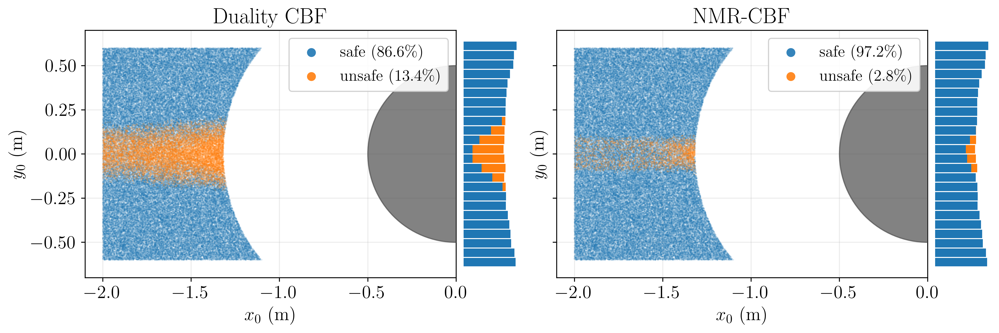

In [369]:
# ── Violation IC distribution: Duality CBF vs NMR-CBF ────────────────────────
# focus_pols = ['Duality CBF', 'NMR-CBF', 'NMR+RCBF']
focus_pols = ['Duality CBF', 'NMR-CBF']
# focus_pols = ['GUARDIAN']
focus_cols = ['C0', 'C2', 'C5']

fig, axes = plt.subplots(1, len(focus_pols), figsize=(6*len(focus_pols), 6), layout='constrained',
                         sharex=True, sharey=True)

for ax, pol_name, col in zip(axes, focus_pols, focus_cols):
    viol = mc_results[pol_name]          # (N_MC,) bool
    n_viol = viol.sum()
    rate   = viol.mean()
    # Safe ICs (blue) — plot first so violations sit on top
    safe_col = 'C0'   # tab10 blue
    viol_col = 'C1'   # tab10 orange

    ax.scatter(px_mc[~viol], py_mc[~viol],
               c=safe_col, edgecolors='none', s=2, alpha=0.15,
               zorder=2, label=f'safe ({100*(1-rate):.1f}\\%)')
    # Violating ICs (orange)
    if n_viol > 0:
        ax.scatter(px_mc[viol], py_mc[viol],
                   c=viol_col, edgecolors='none', s=2, alpha=0.2,
                   zorder=3, label=f'{{unsafe ({100*rate:.1f}\\%)}}')

    # Obstacle
    obs_p = plt.Circle((float(task.pos_obs[0]), float(task.pos_obs[1])),
                        task.radius_obs, color='0.3', alpha=0.7, zorder=4)
    ax.add_patch(obs_p)

    ax.set(xlim=(-2.1, 0.0), ylim=(-0.7, 0.7), aspect='equal',
           xlabel='$x_0$ (m)', ylabel='$y_0$ (m)',
           title=f'{pol_name}'
    )
    leg = ax.legend(fontsize=14, loc='upper right', framealpha=0.9)
    for h in leg.legend_handles:
        h.set_sizes([60])
        h.set_alpha(0.9)
    ax.grid(alpha=0.25)

    # Marginal histograms — stacked so safe/violated bars sit on top of each other
    # ax_top   = ax.inset_axes([0, 1.02, 1, 0.18])
    ax_right = ax.inset_axes([1.02, 0, 0.15, 1])
    bins_x = np.linspace(-2.2, 0.3, 25)
    bins_y = np.linspace(-0.6, 0.6, 25)

    # ax_top.hist([px_mc[~viol], px_mc[viol]], bins=bins_x,
    #             color=[safe_col, viol_col], stacked=True, rwidth=0.9)
    # ax_top.axis('off')

    ax_right.hist([py_mc[~viol], py_mc[viol]], bins=bins_y,
                  color=[safe_col, viol_col], stacked=True,
                  orientation='horizontal', rwidth=0.9)
    ax_right.axis('off')

# fig.suptitle(
#     f'Violating IC distribution (N={N_MC}, constant bias $\\varepsilon$='
#     f'({float(STATE_EPS_DUAL[0]):.2f}, {float(STATE_EPS_DUAL[1]):.2f}) m)',
#     y=0.85
# )
plt.show()


Nom+noise: mean actual control = 0.055, mean nominal control = 0.058
CBF+noise: mean actual control = 0.596, mean nominal control = 0.650
R-CBF-QP: mean actual control = 0.918, mean nominal control = 0.844
Duality CBF: mean actual control = 0.569, mean nominal control = 0.628
R-CBF (0.2): mean actual control = 0.623, mean nominal control = 0.679
R-CBF (1.0): mean actual control = 0.743, mean nominal control = 0.836
NMR-CBF: mean actual control = 0.672, mean nominal control = 0.733
GUARDIAN: mean actual control = 0.866, mean nominal control = 0.733


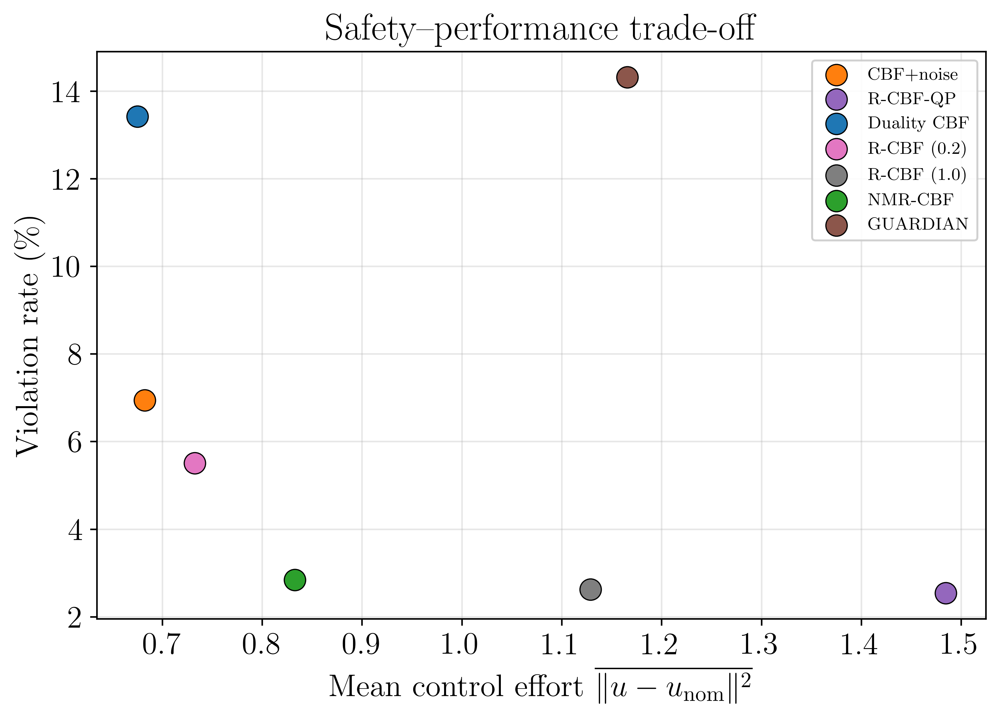

Policy           Viol. rate  Mean effort
----------------------------------------
Nom+noise            100.0%       0.0008
CBF+noise              6.9%       0.6824
R-CBF-QP               2.5%       1.4843
Duality CBF           13.4%       0.6751
R-CBF (0.2)            5.5%       0.7324
R-CBF (1.0)            2.6%       1.1288
NMR-CBF                2.8%       0.8326
GUARDIAN              14.3%       1.1657


In [364]:
# ── Control effort vs violation rate scatter ──────────────────────────────────
# Back-compute applied control from state trajectories (Euler, u only affects theta):
#   u_actual = (theta_{t+1} - theta_t) / (DT * umax)
# Compare to what the nominal controller wanted: u_nom = nom_pol_goto(xhat)

_nom_vmap = jax.jit(jax.vmap(jax.vmap(task.nom_pol_goto)))

effort_by_pol = {}
for pol_name, xs_all in mc_trajs.items():
    xs_jnp = jnp.array(xs_all)
    # Back-compute actual control from theta differences
    dtheta = xs_jnp[:, 1:, task.THETA] - xs_jnp[:, :-1, task.THETA]
    # Wrap angle differences to [-pi, pi]
    dtheta = (dtheta + jnp.pi) % (2 * jnp.pi) - jnp.pi
    u_actual = dtheta / (DT * task.umax)                    # (N_MC, T)

    # Nominal control at each step's observed state
    xhats = xs_jnp[:, :-1, :] + mc_biases[:, None, :]       # (N_MC, T, nx)
    u_noms = jax2np(_nom_vmap(xhats))[:, :, 0]              # (N_MC, T)
    u_actual_np = jax2np(u_actual)

    print(f"{pol_name}: mean actual control = {np.abs(u_actual_np).mean():.3f}, "
          f"mean nominal control = {np.abs(u_noms).mean():.3f}")

    # Per-trajectory mean squared control difference
    traj_effort = np.nanmean((u_actual_np - u_noms) ** 2, axis=1)   # (N_MC,); nanmean ignores NaN steps from infeasible QPs
    n_nan = np.isnan(u_actual_np).any(axis=1).sum()
    if n_nan > 0:
        print(f"  {pol_name}: {n_nan}/{u_actual_np.shape[0]} trajectories have NaN controls (QP infeasible)")
    effort_by_pol[pol_name] = traj_effort

# ── Scatter: violation rate vs mean control effort ────────────────────────────
pol_names_plot  = list(mc_results.keys())
pol_colors_plot = dict(zip(
    ['Nom+noise', 'CBF+noise', 'R-CBF-QP', 'Duality CBF',
     'R-CBF (0.2)', 'R-CBF (1.0)', 'MR-CBF',
     'NMR-CBF', 'GUARDIAN'],
    ['C3', 'C1', 'C4', 'C0', 'C6', 'C7', 'C8', 'C2', 'C5']
))

fig, ax = plt.subplots(figsize=(7, 5), layout='constrained')

for pol_name in pol_names_plot:
    if pol_name != 'Nom+noise':
        viol_rate = 100 * mc_results[pol_name].mean()
        mean_effort = effort_by_pol[pol_name].mean()
        col = pol_colors_plot.get(pol_name, 'k')
        ax.scatter(mean_effort, viol_rate, s=120, c=col, edgecolors='k',
                linewidths=0.6, zorder=5, label=pol_name)

ax.set(xlabel=r'Mean control effort  $\overline{\|u - u_{\mathrm{nom}}\|^2}$',
       ylabel=r'Violation rate (\%)',
       title='Safety--performance trade-off')
ax.legend(fontsize=9, loc='best', framealpha=0.9)
ax.grid(alpha=0.3)

# Annotate the ideal corner
ax.annotate('ideal', xy=(0, 0), fontsize=8, color='gray', alpha=0.6,
            xytext=(0.05, 2), arrowprops=dict(arrowstyle='->', color='gray', alpha=0.4))

plt.show()

# Print table
print(f"{'Policy':<16} {'Viol. rate':>10} {'Mean effort':>12}")
print('-' * 40)
for pol_name in pol_names_plot:
    vr = 100 * mc_results[pol_name].mean()
    me = effort_by_pol[pol_name].mean()
    print(f"{pol_name:<16} {vr:>9.1f}% {me:>12.4f}")


In [365]:
# # ── Save MC violation rates + control effort for current STATE_EPS_DUAL ────────
# import pickle
# from pathlib import Path

# _mc_results_dir = Path('../../runs/nmr_cbf_dubins3d/mc_sweep')
# _mc_results_dir.mkdir(parents=True, exist_ok=True)

# eps_y_val = float(STATE_EPS_DUAL[1])
# _mc_file = _mc_results_dir / f'mc_eps_y_{eps_y_val:.4f}.pkl'

# _mc_save = {
#     'STATE_EPS_DUAL': jax2np(STATE_EPS_DUAL),
#     'N_MC': N_MC,
#     'violation_rates':  {name: float(viol.mean()) for name, viol in mc_results.items()},
#     'violation_counts': {name: int(viol.sum())    for name, viol in mc_results.items()},
#     'mean_effort':      {name: float(eff.mean())  for name, eff  in effort_by_pol.items()},
# }
# with open(_mc_file, 'wb') as f:
#     pickle.dump(_mc_save, f)
# print(f'Saved MC results for eps_y={eps_y_val:.4f} to {_mc_file}')
# print(f'  Rates:  { {k: f"{100*v:.1f}%" for k, v in _mc_save["violation_rates"].items()} }')
# print(f'  Effort: { {k: f"{v:.4f}"     for k, v in _mc_save["mean_effort"].items()} }')


\begin{table}[t]
\centering
\caption{Violation rate (\%) vs.\ measurement uncertainty $\varepsilon_y$ (m)}
\label{tab:mc_violation_rates}
\begin{tabular}{llcc}
\toprule
Category & Approach & $\varepsilon_y = 0.10$ & $\varepsilon_y = 0.30$ \\
\multirow{2}{*}{Non-robust} & Nom & 100.0 & 99.8 \\
 & CBF & 6.8 & 16.9 \\
\midrule
\multirow{2}{*}{\shortstack[l]{Set-based \\robust}} & Duality CBF & 17.9 & 36.4 \\
 & GUARDIAN & 14.3 & 45.6 \\
\midrule
\multirow{5}{*}{\shortstack[l]{Point-based \\robust}} & R-CBF-QP & 2.5 & 4.0 \\
 & R-CBF-QP & 2.5 & 4.0 \\
 & R-CBF (0.2) & 5.4 & 13.2 \\
 & R-CBF (1.0) & 2.6 & 4.7 \\
 & NMR-CBF & 2.8 & 4.0 \\
\bottomrule
\end{tabular}
\end{table}

(2 epsilon values, 8 approaches)



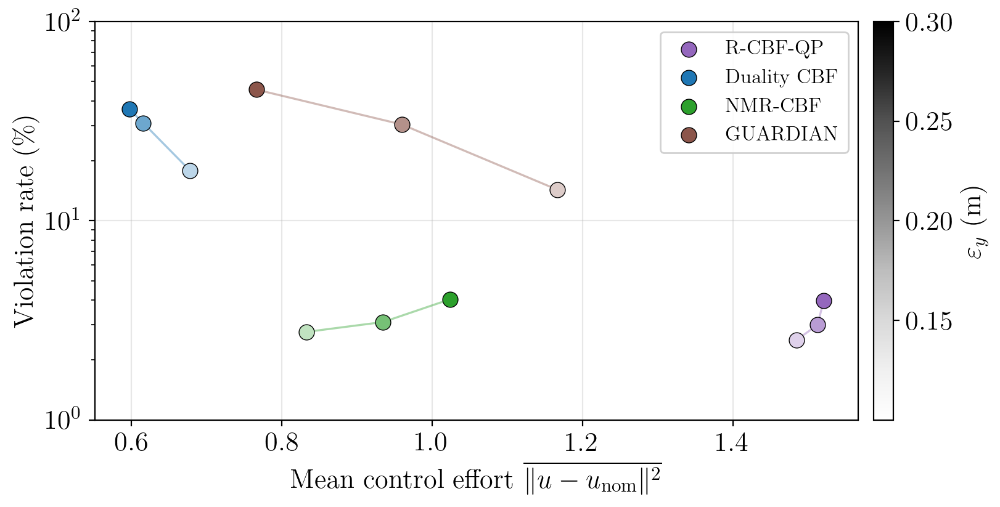

: 

In [ ]:
# ── LaTeX table + safety--performance trade-off across epsilon values ─────────
import math
import pickle
from pathlib import Path
import matplotlib.colors as mcolors
import matplotlib.cm as cm

_mc_results_dir = Path('../../runs/nmr_cbf_dubins3d/mc_sweep')
result_files = sorted(_mc_results_dir.glob('mc_eps_y_*.pkl'))

if not result_files:
    print("No saved MC results found. Run the save cell for each eps_y value first.")
else:
    all_results_full = []
    for f in result_files:
        with open(f, 'rb') as fh:
            all_results_full.append(pickle.load(fh))
    all_results_full.sort(key=lambda r: r['STATE_EPS_DUAL'][1])

    def _eps_filter(results, subset):
        if subset is None:
            return results
        return [r for r in results
                if any(abs(r['STATE_EPS_DUAL'][1] - e) < 1e-4
                       for e in subset)]

    # ── Subset selectors (both filter independently from the full loaded set) ─
    PLOT_EPS_SUBSET  = [0.01, 0.05, 0.1, 0.2, 0.3]# [0.01, 0.05, 0.1, 0.2, 0.3, 0.4]  # None = all
    TABLE_EPS_SUBSET = [0.0, 0.1, 0.3]                    # None = all

    plot_results  = _eps_filter(all_results_full, PLOT_EPS_SUBSET)
    table_results = _eps_filter(all_results_full, TABLE_EPS_SUBSET)

    approaches = list(all_results_full[0]['violation_rates'].keys())
    eps_vals   = [r['STATE_EPS_DUAL'][1] for r in plot_results]

    # ── LaTeX table ───────────────────────────────────────────────────────────
    # Display names (key = internal name, value = LaTeX label in table)
    TABLE_DISPLAY_NAMES = {
        'Nom+noise':   'Nom',
        'CBF+noise':   'CBF',
        'CBF':         'CBF',
        'Duality CBF': 'Duality CBF',
        'GUARDIAN':    'GUARDIAN',
        'R-CBF-QP':    'R-CBF-QP',
        'R-CBF (0.2)': 'R-CBF (0.2)',
        'R-CBF (1.0)': 'R-CBF (1.0)',
        'MR-CBF':      'MR-CBF',
        'NMR-CBF':     'NMR-CBF',
    }
    # Category structure; any approach not listed here lands in Point-based robust
    # before NMR-CBF (which is always last in that category).
    TABLE_CATEGORIES = [
        ('Non-robust',                    ['Nom+noise', 'CBF+noise', 'CBF']),
        (r'\shortstack[l]{Set-based \\robust}',   ['Duality CBF', 'GUARDIAN']),
        (r'\shortstack[l]{Point-based \\robust}', None),  # None = auto-fill
    ]
    _explicit = {a for _, lst in TABLE_CATEGORIES if lst for a in lst}
    _extra = [a for a in approaches if a not in _explicit and a != 'NMR-CBF']
    TABLE_CATEGORIES[-1] = (
        TABLE_CATEGORIES[-1][0],
        ['R-CBF-QP'] + _extra + ['NMR-CBF']
    )

    table_eps_vals = [r['STATE_EPS_DUAL'][1] for r in table_results]
    n_eps    = len(table_eps_vals)
    col_spec = 'll' + 'c' * n_eps
    lines = [
        r'\begin{table}[t]', r'\centering',
        r'\caption{Violation rate (\%) vs.\ measurement uncertainty $\varepsilon_y$ (m)}',
        r'\label{tab:mc_violation_rates}',
        f'\\begin{{tabular}}{{{col_spec}}}', r'\toprule',
    ]
    header = 'Category & Approach'
    for eps in table_eps_vals:
        header += f' & $\\varepsilon_y = {eps:.2f}$'
    lines.append(header + r' \\')
    first_cat = True
    for cat_name, cat_approaches in TABLE_CATEGORIES:
        # Filter to approaches that actually appear in the data
        cat_rows = [a for a in cat_approaches if a in approaches]
        if not cat_rows:
            continue
        if not first_cat:
            lines.append(r'\midrule')
        first_cat = False
        for i, approach in enumerate(cat_rows):
            disp = TABLE_DISPLAY_NAMES.get(approach, approach)
            if i == 0:
                row = f'\\multirow{{{len(cat_rows)}}}{{*}}{{{cat_name}}} & {disp}'
            else:
                row = f' & {disp}'
            for res in table_results:
                rate = res['violation_rates'].get(approach, float('nan'))
                row += f' & {100*rate:.1f}'
            lines.append(row + r' \\')
    lines += [r'\bottomrule', r'\end{tabular}', r'\end{table}']
    print('\n'.join(lines))
    print(f'\n({len(table_results)} epsilon values, {len(approaches)} approaches)\n')
    # ── Safety--performance scatter across epsilon values ─────────────────────
    # Each method has a fixed base colour; saturation encodes eps_y.
    pol_base_colors = {
        'Nom+noise':    'C3',
        'CBF':          'C1',
        'R-CBF-QP':     'C4',
        'Duality CBF':  'C0',
        'R-CBF (0.2)':  'C6',
        'R-CBF (1.0)':  'C7',
        # 'MR-CBF':       'C8',
        'NMR-CBF':      'C2',
        'GUARDIAN':     'C5',
    }

    # ── Policy subset: set to None to plot all, or list names to include ──────
    PLOT_POLICIES = ['Duality CBF', 'NMR-CBF', 'GUARDIAN', 'R-CBF-QP']

    plot_approaches = (
        [a for a in approaches if a in PLOT_POLICIES]
        if PLOT_POLICIES is not None else approaches
    )
    plot_approaches = [a for a in plot_approaches if a != 'Nom+noise']

    eps_min = min(eps_vals)
    eps_max = max(eps_vals)

    def _desaturate(hex_color, saturation):
        """Blend hex_color with white by saturation in [0, 1]."""
        r, g, b = mcolors.to_rgb(hex_color)
        r2 = 1.0 + saturation * (r - 1.0)
        g2 = 1.0 + saturation * (g - 1.0)
        b2 = 1.0 + saturation * (b - 1.0)
        return (r2, g2, b2)

    fig, ax = plt.subplots(figsize=(8, 4), layout='constrained')

    # Collect per-policy points ordered by eps_y, then draw lines + scatter
    for approach in plot_approaches:
        base = pol_base_colors.get(approach, 'k')
        base_rgb = mcolors.to_rgb(base)
        xs_line, ys_line, cols_line = [], [], []

        for res in plot_results:
            eps_y = res['STATE_EPS_DUAL'][1]
            if approach not in res['violation_rates']:
                continue
            viol   = 100 * res['violation_rates'][approach]
            effort = res['mean_effort'].get(approach, float('nan'))
            if math.isnan(effort):
                print(f'  WARNING: missing effort for {approach!r} at eps_y={eps_y:.4f} — skipping point')
                continue
            sat = (eps_y - eps_min) / (eps_max - eps_min + 1e-9)
            sat = 0.3 + 0.7 * sat
            col = _desaturate(base, sat)
            xs_line.append(effort)
            ys_line.append(viol)
            cols_line.append(col)

        if not xs_line:
            continue

        # Line connecting points in eps order (using base colour, semi-transparent)
        ax.plot(xs_line, ys_line, color=base_rgb, linewidth=1.2, alpha=0.4, zorder=3)

        # Scatter dots on top with saturation-encoded colour
        for x, y, c in zip(xs_line, ys_line, cols_line):
            ax.scatter(x, y, s=80, c=[c], edgecolors='k', linewidths=0.5, zorder=5)

        # Legend proxy: full-saturation dot
        ax.scatter([], [], c=[base_rgb], s=80, edgecolors='k',
                   linewidths=0.5, label=approach)

    # Saturation colorbar to show eps scale
    sm = cm.ScalarMappable(
        cmap=cm.Greys,
        norm=mcolors.Normalize(vmin=eps_min, vmax=eps_max)
    )
    sm.set_array([])
    fig.colorbar(sm, ax=ax, label=r'$\varepsilon_y$ (m)', fraction=0.04, pad=0.02)

    ax.set_yscale('log')
    ax.set(
        xlabel=r'Mean control effort  $\overline{\|u - u_{\mathrm{nom}}\|^2}$',
        ylabel=r'Violation rate (\%)',
        yticks=[1, 10, 100],
    )
    ax.legend(fontsize=12, loc='upper right', framealpha=0.9)

    ax.grid(alpha=0.3)
    plt.show()

## Timing

Per-step compute time for each policy.

  Nom+noise       0.5 ms +/- 0.1 ms  (0.010 ms/step)
  CBF+noise       23.5 ms +/- 1.0 ms  (0.470 ms/step)
  R-CBF-QP        27.2 ms +/- 0.8 ms  (0.545 ms/step)
  Duality CBF     57.0 ms +/- 0.3 ms  (1.140 ms/step)
  R-CBF (0.2)     22.5 ms +/- 0.1 ms  (0.451 ms/step)
  R-CBF (1.0)     27.5 ms +/- 0.1 ms  (0.549 ms/step)
  NMR-CBF         23.1 ms +/- 0.1 ms  (0.462 ms/step)
  GUARDIAN        3.5 ms +/- 0.0 ms  (0.070 ms/step)


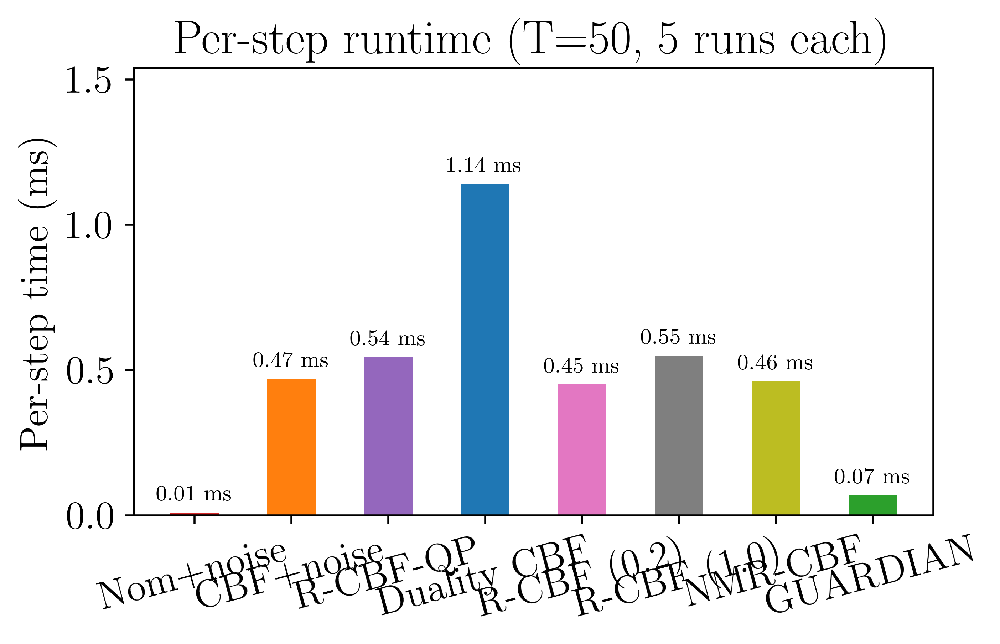

In [367]:
import time

x_time    = jnp.array(list(x_ics.values())[0])
bias_time = _sample_bias(BASE_KEY)

# Pre-compile all policies
for fn in [rollout_nom_noisy, rollout_cbf_noisy, rollout_rcbf, rollout_duality,
           rollout_rcbf_02, rollout_rcbf_10,
           rollout_nmr_cbf, rollout_guardian]:
    fn(x_time, bias_time)

N_REPEATS = 5
timing = {}
for pol_name, rollout_fn in [('Nom+noise',   rollout_nom_noisy),
                              ('CBF+noise',   rollout_cbf_noisy),
                              ('R-CBF-QP',    rollout_rcbf),
                              ('Duality CBF', rollout_duality),
                              ('R-CBF (0.2)', rollout_rcbf_02),
                              ('R-CBF (1.0)', rollout_rcbf_10),
                              ('NMR-CBF',     rollout_nmr_cbf),
                              ('GUARDIAN',     rollout_guardian),
                              ]:
    times = []
    for _ in range(N_REPEATS):
        t0 = time.perf_counter()
        jax.block_until_ready(rollout_fn(x_time, bias_time))
        times.append(time.perf_counter() - t0)
    timing[pol_name] = times
    print(f'  {pol_name:<14}  {np.mean(times)*1e3:.1f} ms +/- {np.std(times)*1e3:.1f} ms'
          f'  ({np.mean(times)/T*1e3:.3f} ms/step)')

# # MR-CBF timing (Python loop, not JIT)
# for pol_name, rollout_fn in [('MR-CBF',      _mrcbf_rollout),
#                             #   ('NMR+RCBF',    rollout_nmr_rcbf)
#                               ]:
#     times = []
#     for _ in range(N_REPEATS):
#         t0 = time.perf_counter()
#         jax.block_until_ready(rollout_fn(x_time, bias_time))
#         times.append(time.perf_counter() - t0)
#     timing[pol_name] = times
#     print(f'  {pol_name:<14}  {np.mean(times)*1e3:.1f} ms ± {np.std(times)*1e3:.1f} ms'
#           f'  ({np.mean(times)/T*1e3:.3f} ms/step)')

names    = list(timing.keys())
per_step = [1e3 * np.mean(v) / T for v in timing.values()]
pol_cols = ['C3', 'C1', 'C4', 'C0', 'C6', 'C7', 'C8', 'C2', 'C5', 'C9']   # matches pol_styles

fig, ax = plt.subplots(figsize=(5.5, 3.5), layout='constrained')
bars = ax.bar(names, per_step, color=pol_cols[:len(names)], width=0.5)
ax.bar_label(bars, labels=[f'{v:.2f} ms' for v in per_step], padding=3, fontsize=9)
ax.set(ylabel='Per-step time (ms)', ylim=(0, max(per_step) * 1.35),
       title=f'Per-step runtime (T={T}, {N_REPEATS} runs each)')
ax.tick_params(axis='x', labelrotation=15)
plt.show()
